# Detección de COVID-19 en imágenes de rayos X de tórax


El objetivo de este proyecto es construir un modelo que identifique COVID-19, neumonía en imágenes de rayos X de tórax. El conjunto de datos está organizado en 3 carpetas (casos COVID-19, Normal, Neumonía) y contiene subcarpetas para cada categoría de imagen. Hay 606 imágenes de rayos X (JPEG). Datos de Mendeley.

In [119]:
# Load and preview images
import matplotlib.pyplot as plt
matplotlib.style.use('fivethirtyeight')
import numpy as np
from skimage.feature import  graycomatrix, graycoprops
import cv2 as cv
import matplotlib.pyplot as plt
# Importing Image class from PIL module
import numpy as np
from PIL import Image
import os
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn import preprocessing
import seaborn as sns
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score

import statsmodels.api as sm

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
import matplotlib.font_manager
from matplotlib import style
style.use('ggplot') or plt.style.use('ggplot')

# Preprocesado y modelado
# ==============================================================================
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.preprocessing import scale

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

# Funciones necesarias para extraer las features de cada imagen

In [5]:
def Result(img):
    result = graycomatrix(img,[1],[0],levels=256)
    return result
def ASM(R):
    a = graycoprops(R,prop='ASM')
    return a
def Contrast(R):
    ct = graycoprops(R,prop='contrast')
    return ct
def Correlation(R):
    cn = graycoprops(R,prop='correlation')
    return cn
def Dissimilarity(R):
    d = graycoprops(R,prop='dissimilarity')
    return d
def Energy(R):
    e = graycoprops(R,prop='energy')
    return e
def Homogeneity(R):
    h = graycoprops(R,prop='homogeneity')
    return h

# def crop_image(img, n):
#     """function to crop a image. img = array n = number of crop need it """
#     M = img.shape[0]//n
#     N = img.shape[1]//n
#     crops = [img[x:x+M,y:y+N] for x in range(0,img.shape[0],M) for y in range(0,img.shape[1],N)]
#     return crops
    
def get_features(img1):
    # Calculating grey-level co-occurrence matrices
    R1 = Result(img1)
    # Calculating GLCM
    GLCM = R1[:,:,0,0]
    # Calculating texture property ASM
    ASM1 = ASM(R1)
    # Calculating texture property Contrast
    Contrast1 = Contrast(R1)
    # Calculating texture property Correlation
    Correlation1 = Correlation(R1)
    # Calculating texture property Dissimilarity
    Dissimilarity1 = Dissimilarity(R1)
    # Calculating texture property Energy
    Energy1 = Energy(R1)
    # Calculating texture property Homogeneity
    Homogeneity1 = Homogeneity(R1)
    output = [ASM1, Contrast1, Correlation1, Dissimilarity1, Energy1, Homogeneity1]
    return [str(feature[0][0]) for feature in output]

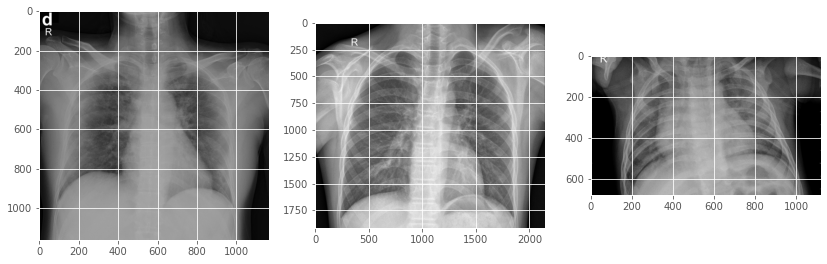

In [7]:
dataroot = "dataroot/"

img_covid     = cv.imread(dataroot+'COVID-19 cases/1-s2.0-S0929664620300449-gr2_lrg-d.jpg',0)
img_normal    = cv.imread(dataroot+'Normal_/IM-0011-0001-0001.jpeg',0)
img_pneumonia = cv.imread(dataroot+'Pneumonia/person1650_virus_2854.jpeg',0)

plt.figure(figsize=(14,14))
plt.subplot(1,3,1)
plt.imshow(img_covid,cmap='gray')
plt.subplot(1,3,2)
plt.imshow(img_normal,cmap='gray')
plt.subplot(1,3,3)
plt.imshow(img_pneumonia,cmap='gray')

In [8]:
#con este obtengo la dir donde se encuentran las images por cada folder

path_01 = os.path.join(os.getcwd(), "dataroot") 
list_folders = os.listdir(path_01)#[0:4]
list_new_folders = []
list_images = {}

for folder in list_folders:
    path = os.path.join(path_01, folder)

    if os.path.isdir(path):
        #if not folder.endswith("O"):
        # list_new_folders.append(folder)
        all_images = os.listdir(path)
        images = []
        for image in all_images:
            if not image.startswith("."):#con esto discrimino aquellos archivos que empiezan con .
                path_img = os.path.join(path_01, folder, image)
                img1 = cv.imread(path_img ,0)
                images.append(img1)
        list_images[folder] = images

print(list_images)

{'COVID-19 cases': [array([[182, 169, 152, ..., 254, 254, 254],
       [165, 150, 138, ..., 254, 254, 254],
       [146, 134, 128, ..., 254, 254, 254],
       ...,
       [243, 244, 245, ..., 254, 254, 254],
       [245, 245, 245, ..., 254, 254, 254],
       [254, 254, 254, ..., 254, 254, 254]], dtype=uint8), array([[ 52,  52,  52, ...,  50,  50,  50],
       [ 52,  52,  52, ...,  50,  50,  50],
       [ 52,  52,  51, ...,  50,  49,  49],
       ...,
       [171, 171, 171, ..., 150, 151, 151],
       [171, 171, 171, ..., 150, 151, 151],
       [170, 170, 170, ..., 151, 151, 151]], dtype=uint8), array([[31, 32, 32, ..., 32, 29, 31],
       [31, 36, 40, ..., 43, 36, 33],
       [31, 40, 48, ..., 55, 42, 32],
       ...,
       [34, 54, 76, ..., 79, 54, 34],
       [30, 40, 51, ..., 54, 41, 33],
       [31, 32, 33, ..., 32, 30, 31]], dtype=uint8), array([[15, 14, 14, ..., 11,  0, 49],
       [13, 13, 13, ..., 10,  0, 50],
       [12, 12, 12, ..., 13,  3, 54],
       ...,
       [11, 11, 1

In [9]:
path_csv = "texture_features_images_covid19_GLCM_v2.csv" 
with open(path_csv, 'w') as file:
    file.write('ASM;CONTRAST;CORRELATION;DISSIMILARITY;ENERGY;HOMOGEINITY;TARGET\n')
#con esta parte se escriben los parametros obtenidos por GLCM y se envian como registro para un archivo .csv

for folder, images in list_images.items():
    for image in images:
        features_img = get_features(image)
        row_info = features_img + [folder]
        row_info = ";".join(row_info)
        with open(path_csv, "a") as file:
            file.write(row_info + "\n") 

In [10]:
#import pandas
import pandas as pd
 
# read csv file
df = pd.read_csv(path_csv, sep=';')
 
# replacing values
df['TARGET'].replace(['COVID-19 cases', 'Normal_', 'Pneumonia'],
                        [0, 1, 2], inplace=True)

In [11]:
df.head(50)# TARGET[covid = 0 normal = 1 pneumonia = 2]

,ASM,CONTRAST,CORRELATION,DISSIMILARITY,ENERGY,HOMOGEINITY,TARGET
0,0.004839,13.482903,0.997581,0.815640,0.069560,0.696242,0
1,0.002999,2.480040,0.999107,0.719861,0.054761,0.690258,0
2,0.000415,50.504538,0.970078,5.361780,0.020382,0.178455,0
3,0.002563,14.356492,0.996987,1.520441,0.050628,0.524019,0
4,0.009462,77.208992,0.989455,3.090761,0.097271,0.369309,0
5,0.008037,31.177552,0.996304,3.547617,0.089647,0.325313,0
6,0.002316,15.336185,0.996587,1.425577,0.048124,0.543891,0
7,0.001282,10.770748,0.996325,2.133411,0.035799,0.438762,0
8,0.000838,10.620371,0.997160,2.181002,0.028944,0.420773,0
9,0.000718,39.094175,0.994617,2.600318,0.026799,0.390837,0


In [12]:
df1 = df.drop('CORRELATION', axis=1)

In [13]:
df1

,ASM,CONTRAST,DISSIMILARITY,ENERGY,HOMOGEINITY,TARGET
0,0.004839,13.482903,0.815640,0.069560,0.696242,0
1,0.002999,2.480040,0.719861,0.054761,0.690258,0
2,0.000415,50.504538,5.361780,0.020382,0.178455,0
3,0.002563,14.356492,1.520441,0.050628,0.524019,0
4,0.009462,77.208992,3.090761,0.097271,0.369309,0
...,...,...,...,...,...,...
598,0.003786,11.729562,1.954031,0.061531,0.480609,2
599,0.010204,41.006168,2.042834,0.101017,0.470882,2
600,0.001639,38.170450,2.496610,0.040487,0.381141,2
601,0.001057,16.282383,1.637463,0.032513,0.512064,2


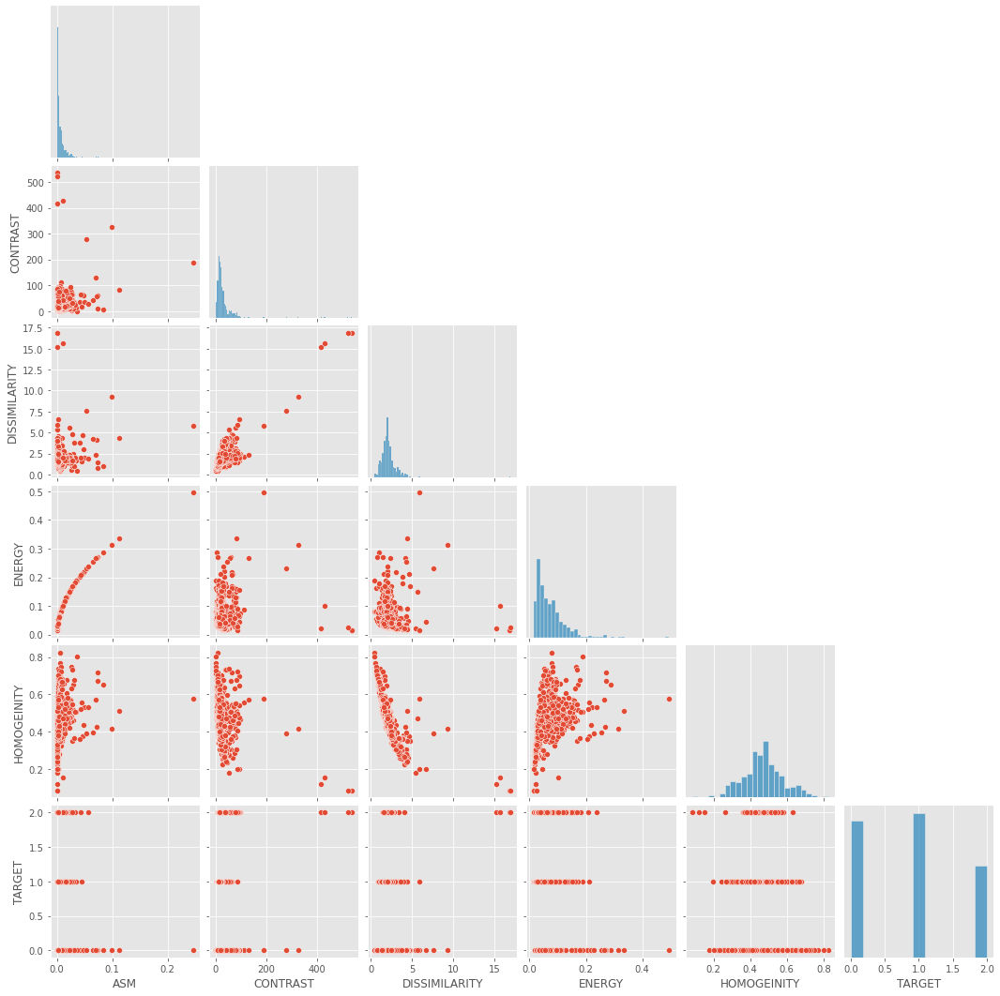

In [15]:
list_columns = df1.columns.tolist()
sns.pairplot(df1[list_columns], corner=True, palette="rainbow")

In [16]:
X = df1.iloc[:,:-1].to_numpy()
y = df1.iloc[:,-1].to_numpy()

In [17]:
# x = df.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)
df_norm = pd.DataFrame(X_scaled)

In [18]:
df_norm

,0,1,2,3,4
0,0.018937,0.023866,0.022638,0.115904,0.827258
1,0.011447,0.003300,0.016819,0.085208,0.819181
2,0.000929,0.093065,0.298843,0.013898,0.128376
3,0.009673,0.025499,0.065459,0.076635,0.594801
4,0.037759,0.142980,0.160865,0.173384,0.385981
...,...,...,...,...,...
598,0.014652,0.020589,0.091802,0.099251,0.536208
599,0.040783,0.075311,0.097198,0.181153,0.523079
600,0.005911,0.070011,0.124767,0.055600,0.401952
601,0.003542,0.029098,0.072569,0.039060,0.578665


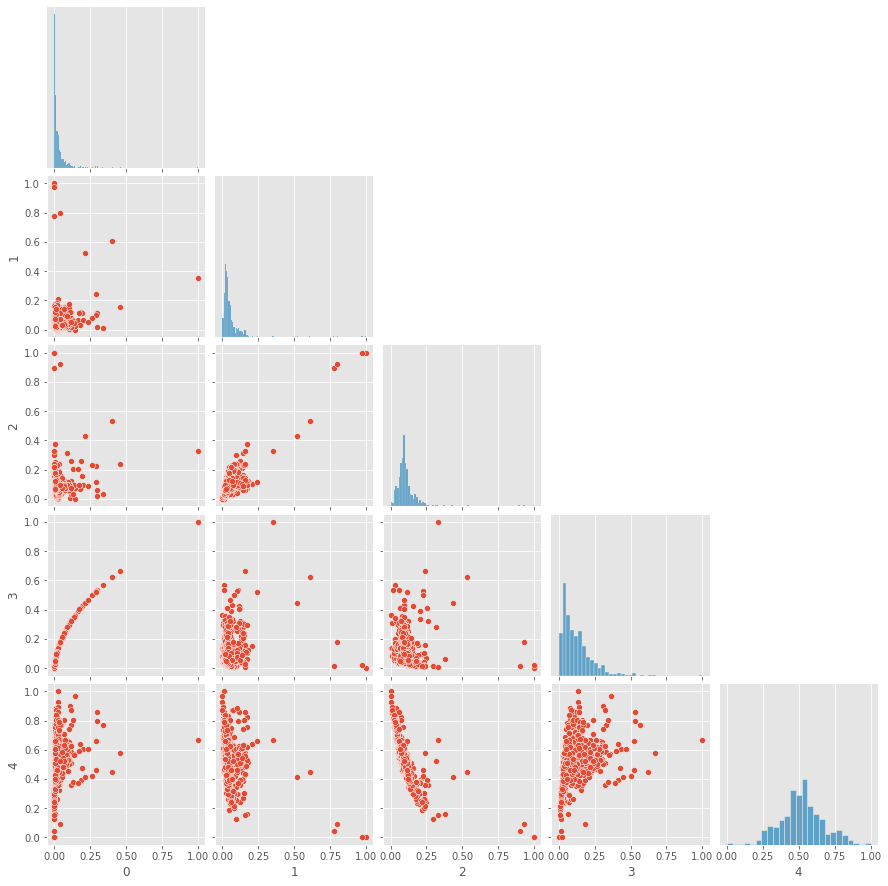

In [19]:
sns.pairplot(df_norm, corner=True, palette="rainbow")

In [20]:
# We partition our dataset into a training set and a test set (20%).
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=21)

<BarContainer object of 3 artists>

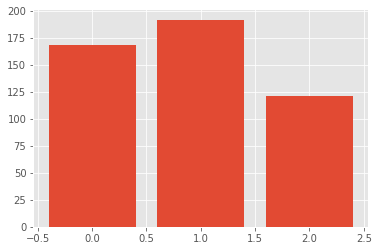

In [23]:
unique, counts = np.unique(y_train, return_counts=True)
plt.bar(unique, counts)

<BarContainer object of 3 artists>

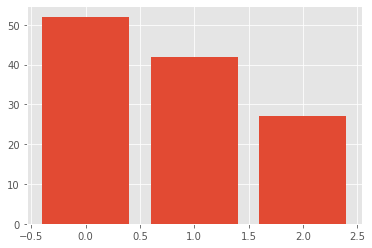

In [24]:
unique1, counts1 = np.unique(y_test, return_counts=True)
plt.bar(unique1, counts1)

# Support Vector Machine

In [25]:
clf = SVC(random_state=21)

In [26]:
clf.fit(X_train, y_train)

SVC(random_state=21)

In [27]:
y_pred_svm = clf.predict(X_test)

In [28]:
pred_values = pd.DataFrame({'Actual value': y_test, 'Predicted value': y_pred_svm})
pred_values.head(20)

,Actual value,Predicted value
0,2,0
1,1,2
2,1,1
3,1,1
4,2,1
5,0,2
6,2,1
7,0,0
8,1,1
9,2,2


In [29]:
exactitud_svm = round(accuracy_score(y_test, y_pred_svm), 4)
precision_svm = round(precision_score(y_test, y_pred_svm, average='weighted'), 4)
sensibilidad_svm = round(recall_score(y_test, y_pred_svm, average='weighted'), 4)
puntaje_svm = round(f1_score(y_test, y_pred_svm, average='weighted'), 4)

print(f'exactitud: {exactitud_svm}\nprecision: {precision_svm}\nsensibilidad: {sensibilidad_svm}\nf1 score: {puntaje_svm}')

exactitud: 0.6116
precision: 0.639
sensibilidad: 0.6116
f1 score: 0.5929


In [30]:
params_grid_svm = {  
               'kernel':['linear','rbf', 'sigmoid'], #'linear', 'rbf' 'poly', 
               'degree':[1, 2, 3],
               'gamma':['scale', 'auto'],
               'coef0':[0.0, 0.25, 0.50, 0.75],
               'tol':[1e-3, 1e-4, 1e-5],
               'C':[0.25, 0.5, 0.75, 1.0]}
grid_svm = GridSearchCV(clf, params_grid_svm, refit = True, verbose = 3,n_jobs=1)
grid_svm.fit(X_train, y_train)

Fitting 5 folds for each of 864 candidates, totalling 4320 fits
[CV 1/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.001;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.001;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.001;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.001;, score=0.396 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.

[CV 2/5] END C=0.25, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.396 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.39

[CV 3/5] END C=0.25, coef0=0.0, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.0, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.0, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.396 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.0, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.0, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.0, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.0, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.0, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.396 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.423 to

[CV 4/5] END C=0.25, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.469 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.490 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.423 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.469 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.490 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.423 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.454 total time=   0

[CV 2/5] END C=0.25, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.469 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.490 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.25, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.25, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.25, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.25, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.25, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 

[CV 4/5] END C=0.25, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.469 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.490 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.25, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.25, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.25, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.25, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.25, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.25, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.25, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, sc

[CV 1/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.423 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.469 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.490 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.423 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.469 total time=   0.0s
[CV 5/

[CV 5/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.490 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.423 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.469 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.490 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.423 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.448 total time=   0.0s
[CV 4

[CV 2/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.469 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.490 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.423 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.469 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.490 total time=   0.0s
[CV 1/

[CV 4/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.469 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.490 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.423 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.469 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.490 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time

[CV 5/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.490 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.423 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.469 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.490 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total t

[CV 5/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.490 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001

[CV 4/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.396 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.515 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.458 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.531 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 3/5] EN

[CV 2/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.458 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.531 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.458 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.531 total time=   0.0s
[CV 1/5] END C

[CV 4/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.396 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.515 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.458 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.531 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 3/5] EN

[CV 4/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.396 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.515 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.458 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.531 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[C

[CV 1/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.515 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.458 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.531 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.458 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 5/

[CV 3/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.458 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.531 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.458 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.531 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.526 total time=   0.0s
[CV 2

[CV 2/5] END C=0.5, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.458 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.531 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.526 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.458 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.531 total time=   0.0s
[CV 1/5] END C=

[CV 3/5] END C=0.5, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.458 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.531 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.526 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.458 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.531 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.5, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 2/5] END

[CV 4/5] END C=0.5, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.531 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.381 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.375 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.333 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.381 total ti

[CV 2/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, 

[CV 4/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.531 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.402

[CV 2/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.402 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.396 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, 

[CV 4/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.323 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.312 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.371 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.320 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.344 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.323 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.312 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=1e-05;, score=0.371 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=1e-05;, 

[CV 5/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.562 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.536 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.557 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.562 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.536 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.448 total time=   0.0s
[CV 4

[CV 1/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.536 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.562 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.371 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.320 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.344 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.323 total time=  

[CV 1/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.392 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.340 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.333 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.323 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.312 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.392 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.340 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.333 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0

[CV 4/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.396 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.536 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.557 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.562 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.536 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.557 total time= 

[CV 3/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.562 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.536 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.557 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.562 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.536 total time=   0

[CV 1/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.536 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.557 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.562 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.536 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 5

[CV 1/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.536 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.562 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.412 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.381 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.385 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.375 total time=  

[CV 4/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.562 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.412 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.381 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.385 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.375 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.312 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.412 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.381

[CV 3/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.562 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.423 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.392 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.417 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.385 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.333 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0

[CV 2/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.448 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.562 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.423 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.392 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.417 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.385 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.333 

[CV 5/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.562 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.423 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.392 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.417 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.385 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.333 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.423 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.392 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001

[CV 5/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.562 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.351 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.330 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.333 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.323 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.260 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.351 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.330 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.333 tot

[CV 1/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.351 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.330 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.333 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.323 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.260 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.351 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.330 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.333 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.32

[CV 4/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.323 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.260 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.351 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.330 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.333 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.323 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.260 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=1e-05;, score=0.351 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=1e-05;, score=0.3

[CV 5/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.562 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.557 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.588 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.469 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.615 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.562 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.588 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.469 total time=   0.0s
[CV 4

[CV 2/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.443 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.406 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.458 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.396 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.423 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.443 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.406 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.458 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.39

[CV 5/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.562 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.557 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.588 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.469 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.615 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.562 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.588 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.469 total time=   0.0s
[CV 4

[CV 1/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.588 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.469 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.615 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.562 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.392 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.351 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.344 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.323 total time=   0.0s
[CV

[CV 5/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.396 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.423 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.443 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.406 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.458 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.396 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.557 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.588 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.469 total time=   0.0s


[CV 2/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.588 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.469 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.615 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.562 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.557 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.588 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.469 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.615 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.562 total time=   0.0s
[CV 1/5] END C

[CV 2/5] END C=1.0, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.588 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.469 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.615 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.562 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.588 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.469 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.615 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.562 total time=   0.0s
[CV 1/

[CV 1/5] END C=1.0, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.588 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.469 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.615 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.562 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.371 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.406 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.75, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.365 total time=  

[CV 4/5] END C=1.0, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.615 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.562 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.588 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.469 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.615 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.562 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.402 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.371 total time=   0.0s


GridSearchCV(estimator=SVC(random_state=21), n_jobs=1,
             param_grid={'C': [0.25, 0.5, 0.75, 1.0],
                         'coef0': [0.0, 0.25, 0.5, 0.75], 'degree': [1, 2, 3],
                         'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'rbf', 'sigmoid'],
                         'tol': [0.001, 0.0001, 1e-05]},
             verbose=3)

In [31]:
y_pred = grid_svm.predict(X_test)

In [32]:
pred_values = pd.DataFrame({'Actual value': y_test, 'Predicted value': y_pred})
pred_values.head(20)

,Actual value,Predicted value
0,2,0
1,1,2
2,1,1
3,1,1
4,2,1
5,0,2
6,2,1
7,0,0
8,1,1
9,2,2


In [33]:
exactitud_svm = round(accuracy_score(y_test, y_pred), 4)
precision_svm = round(precision_score(y_test, y_pred, average='weighted'), 4)
sensibilidad_svm = round(recall_score(y_test, y_pred, average='weighted'), 4)
puntaje_svm = round(f1_score(y_test, y_pred, average='weighted'), 4)

print(f'exactitud: {exactitud_svm}\nprecision: {precision_svm}\nsensibilidad: {sensibilidad_svm}\nf1 score: {puntaje_svm}')

exactitud: 0.6116
precision: 0.639
sensibilidad: 0.6116
f1 score: 0.5929


# Knn classifier

In [34]:
# train the classifier
classifier = KNeighborsClassifier(n_neighbors=3)
classifier.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [35]:
y_pred_ = classifier.predict(X_test)

In [36]:
pred_values = pd.DataFrame({'Actual value': y_test, 'Predicted value': y_pred_})
pred_values.head(100)

,Actual value,Predicted value
0,2,1
1,1,0
2,1,0
3,1,1
4,2,2
...,...,...
95,0,1
96,1,0
97,2,2
98,0,1


In [37]:
exactitud_svm = round(accuracy_score(y_test, y_pred_), 4)
precision_svm = round(precision_score(y_test, y_pred_, average='weighted'), 4)
sensibilidad_svm = round(recall_score(y_test, y_pred_, average='weighted'), 4)
puntaje_svm = round(f1_score(y_test, y_pred_, average='weighted'), 4)

print(f'exactitud: {exactitud_svm}\nprecision: {precision_svm}\nsensibilidad: {sensibilidad_svm}\nf1 score: {puntaje_svm}')

exactitud: 0.6281
precision: 0.6278
sensibilidad: 0.6281
f1 score: 0.6269


In [38]:
cf_mx = confusion_matrix(y_test, y_pred_)
print(cf_mx)

[[36 11  5]
 [12 25  5]
 [ 9  3 15]]


In [39]:
params_grid_ = {  
               'n_neighbors':[n for n in range(3, 150)], 
               'weights':['uniform', 'distance'],
               'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute'],
               'leaf_size':[20, 30, 40],
               'metric': ['chebyshev', 'manhattan', 'minkowski']}
grid_ = GridSearchCV(classifier, params_grid_, refit = True, verbose = 3,n_jobs=1)
grid_.fit(X_train, y_train)

Fitting 5 folds for each of 10584 candidates, totalling 52920 fits
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebys

[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=14, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=14, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=14, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=14, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=14, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=14, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=14, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=14, weights=distance;, score=0.646 total 

[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=24, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=24, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=24, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=24, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=24, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=24, weights=distance;, score=0.619 total ti

[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=34, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=34, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=34, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=34, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=34, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=34, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=34, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=34, weights=distance;, score=0.656 total 

[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=44, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=44, weights=uniform;, score=0.567 total 

[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=distance;, score=0.588 total ti

[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.510 total t

[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=distance;, score=0.510 total t

[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=77, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=77, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=77, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=77, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=77, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=uniform;, score=0.438 total 

[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.546 total 

[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=93, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=93, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=93, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=93, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=93, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=93, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=93, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=uniform;, score=0.474 total 

[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.500

[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=distance;, score=0.567 

[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=115, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=116, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=116, weights=uniform;, score=0.48

[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=122, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=122, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=122, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=122, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=122, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=122, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=123, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=123, weights=uniform;, score=0.48

[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=129, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=129, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=129, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=129, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=129, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=130, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=130, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=130, weights=uniform;, score=0.36

[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=136, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=136, weights=uniform;, score=0.479 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=136, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=136, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=136, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=136, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=136, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=137, weights=uniform;, score=0.50

[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=143, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=143, weights=uniform;, score=0.396 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=143, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=143, weights=uniform;, score=0.458 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.500

[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.688 total time

[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=14, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=14, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=14, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=14, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=14, weights=distance;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=15, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=15, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=15, weights=uniform;, score=0.615 total 

[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=distance;, score=0.552 total t

[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=37, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.567 total 

[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=47, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=48, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=48, weights=distance;, score=0.557 total ti

[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=57, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=57, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=57, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=58, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=58, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=58, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=58, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=58, weights=uniform;, score=0.646 total ti

[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=67, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=67, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=67, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=68, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=68, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=68, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=68, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=68, weights=uniform;, score=0.635 total ti

[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.542 total t

[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=84, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=84, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=84, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=84, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=84, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.469 total 

[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=92, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=92, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=92, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=92, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=92, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=92, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=93, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=93, weights=uniform;, score=0.515 total 

[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=100, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=101, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=101, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=101, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=101, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=101, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=101, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=101, weights=distance;, score=0.557 

[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=109, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=109, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=109, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=109, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=109, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=109, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=109, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=109, weights=distance;, score=0.542 

[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=116, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=117, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=117, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=117, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=117, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=117, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=117, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=117, weights=distance;, score=0.557 

[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=124, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=124, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=124, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=124, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=124, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=125, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=125, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=125, weights=uniform;, score=0.44

[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=132, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=132, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=132, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=132, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=132, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=133, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=133, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=133, weights=uniform;, score=0.43

[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=140, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=140, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=140, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=140, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=140, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=141, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=141, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=141, weights=uniform;, score=0.42

[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=148, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=148, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=148, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=148, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=148, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=148, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=148, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=148, weights=distance;, score=0.531

[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=12, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=12, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=12, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=12, weights=distance;, score=0.562 total t

[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=23, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=23, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=23, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=23, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=23, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=23, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=23, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=23, weights=distance;, score=0.667 total 

[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=33, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=33, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=33, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=33, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=34, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=34, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=34, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=34, weights=uniform;, score=0.510 total t

[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=44, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=44, weights=uniform;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=44, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=44, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=44, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=44, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=44, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=45, weights=uniform;, score=0.536 total 

[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=54, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=54, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=54, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=54, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=54, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=54, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=54, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=55, weights=uniform;, score=0.515 total 

[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=63, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=63, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=63, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=63, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=63, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=64, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=64, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=64, weights=uniform;, score=0.448 total 

[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=72, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=72, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=72, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=72, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=72, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=72, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=72, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.495 total 

[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=81, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=81, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=81, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=81, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=81, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.536 total 

[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=89, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=89, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=89, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=89, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=89, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.438 total 

[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=distance;, score=0.510 total t

[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=106, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=106, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=106, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=106, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=106, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=106, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=106, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=107, weights=uniform;, score=0.46

[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=114, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=114, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=114, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=114, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=114, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=114, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.49

[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=122, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=122, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=122, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=122, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=122, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=122, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=122, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=123, weights=uniform;, score=0.45

[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=130, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=130, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=130, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=131, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=131, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=131, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=131, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=131, weights=uniform;, score=0.542 

[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=137, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=138, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=138, weights=distance;, score=0.557 

[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=145, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=145, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=145, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=145, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=145, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=145, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=145, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=146, weights=uniform;, score=0.44

[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=7, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=7, weights=uniform;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=7, weights=uniform;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=7, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=7, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=7, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=7, weights=distance;, score=0.625 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=7, weights=distance;, score=0.562 total time=   0

[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=17, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=17, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=17, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=18, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=18, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=18, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=18, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=18, weights=uniform;, score=0.625 total ti

[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=28, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=28, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=28, weights=uniform;, score=0.521 total 

[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=38, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=38, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=38, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=38, weights=uniform;, score=0.542 total t

[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=47, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=47, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=47, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=47, weights=uniform;, score=0.552 total t

[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=55, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=55, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=55, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=55, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=55, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=56, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=56, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=56, weights=uniform;, score=0.469 total 

[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=distance;, score=0.588 total ti

[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.598 total ti

[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=uniform;, score=0.448 total 

[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=90, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=distance;, score=0.598 total ti

[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.688 total 

[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=107, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=107, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=107, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=107, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=107, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=107, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=107, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.46

[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=115, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=115, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=115, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=115, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.510

[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=122, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=122, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=122, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=122, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=122, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=123, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=123, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=123, weights=uniform;, score=0.37

[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=129, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=129, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=129, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=129, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=130, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=130, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=130, weights=uniform;, score=0.365 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=130, weights=uniform;, score=0.490

[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=136, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=136, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=136, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=136, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=137, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=137, weights=uniform;, score=0.454 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=137, weights=uniform;, score=0.375 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=137, weights=uniform;, score=0.438

[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=143, weights=uniform;, score=0.458 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=144, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=144, weights=uniform;, score=0.47

[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=3, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=3, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=3, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=3, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=3, weights=distance;, score=0.729 total time=   

[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=15, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=15, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=15, weights=distance;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=16, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=16, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=16, weights=uniform;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=16, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=16, weights=uniform;, score=0.677 total ti

[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=27, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=27, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=27, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=27, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=27, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=28, weights=uniform;, score=0.608 total 

[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=38, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=38, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=38, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=38, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=38, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=39, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=39, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=39, weights=uniform;, score=0.531 total 

[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=49, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=49, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=49, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=49, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=49, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=49, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=49, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=50, weights=uniform;, score=0.515 total 

[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=59, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=59, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=59, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=59, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=60, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=60, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=60, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=60, weights=uniform;, score=0.562 total t

[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=69, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=69, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=69, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=69, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=69, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=69, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=70, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=70, weights=uniform;, score=0.536 total 

[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=79, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=79, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=79, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=79, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=79, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=79, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=79, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=79, weights=distance;, score=0.542 total t

[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=88, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=88, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=88, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=88, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=88, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=88, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=88, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=89, weights=uniform;, score=0.495 total 

[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=97, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=97, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=97, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=97, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=97, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=97, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=97, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=98, weights=uniform;, score=0.495 total 

[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=106, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=106, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=106, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=106, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=106, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=106, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=106, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=106, weights=distance;, score=0.68

[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=114, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=114, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=114, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=114, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=114, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=115, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=115, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=115, weights=uniform;, score=0.45

[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=121, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=121, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=122, weights=distance;, score=0.588 

[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=129, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=130, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=130, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=130, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=130, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=130, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=130, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=130, weights=distance;, score=0.546 

[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=137, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=137, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=138, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=138, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=138, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=138, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=138, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=138, weights=distance;, score=0.588 

[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=145, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=145, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=145, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=145, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=145, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=146, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=146, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=146, weights=uniform;, score=0.44

[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=8, weights=uniform;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=8, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=8, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=8, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=8, weights=distance;, score=0.667 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=8, weights=distance;, score=0.604 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=8, weights=distance;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=9, weights=uniform;, score=0.680 total time=   

[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=20, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=20, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=20, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=20, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=20, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=20, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=20, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=21, weights=uniform;, score=0.588 total 

[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=31, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=31, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=31, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=31, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=32, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=32, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=32, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=32, weights=uniform;, score=0.521 total t

[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=42, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=42, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=42, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=42, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=42, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=43, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=43, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=43, weights=uniform;, score=0.469 total 

[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=53, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=53, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=53, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=53, weights=distance;, score=0.542 total t

[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=63, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=63, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=63, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=63, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=63, weights=distance;, score=0.688 total 

[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=72, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=72, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=72, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.604 total ti

[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=81, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=82, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=82, weights=distance;, score=0.567 total ti

[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=91, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=91, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=91, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=91, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=91, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=91, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=91, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=91, weights=distance;, score=0.531 total t

[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=99, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=100, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=100, weights=distance;, score=0.567 t

[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=108, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=108, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=108, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=108, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=108, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=109, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=109, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=109, weights=uniform;, score=0.42

[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=116, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=116, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=116, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=116, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=117, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=117, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=117, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=117, weights=uniform;, score=0.510

[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=124, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=124, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=124, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=124, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=124, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=125, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=125, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=125, weights=uniform;, score=0.42

[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=132, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=132, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=132, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=132, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=132, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=133, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=133, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=133, weights=uniform;, score=0.42

[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=140, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=140, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=140, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=140, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=140, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=140, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=140, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=141, weights=uniform;, score=0.47

[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=147, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=148, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=148, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=148, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=148, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=148, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=148, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=148, weights=distance;, score=0.557 

[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=11, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=11, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=11, weights=distance;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=11, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=11, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=12, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=12, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=12, weights=uniform;, score=0.573 total 

[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=23, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=23, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=23, weights=uniform;, score=0.542 total 

[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=33, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=33, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=33, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=33, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.500 total t

[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.521 total ti

[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.542 total t

[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=62, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=62, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=62, weights=distance;, score=0.500 total ti

[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=70, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=70, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=70, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=70, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=71, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=71, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=71, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=71, weights=uniform;, score=0.510 total t

[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=78, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=uniform;, score=0.546 total 

[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=uniform;, score=0.485 total 

[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=94, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=94, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=94, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=94, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=94, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=94, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.515 total 

[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=103, weights=uniform;, score=0.46

[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=distance;, score=0.490 

[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=118, weights=uniform;, score=0.47

[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.37

[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.365 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.458 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.490 

[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=138, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=138, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.464 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.385 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.427 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.469 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.567 

[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=145, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=145, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=145, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=uniform;, score=0.454 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=uniform;, score=0.396 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=uniform;, score=0.448 

[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=7, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=7, weights=distance;, score=0.781 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=8, weights=uniform;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=8, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=8, weights=uniform;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=8, weights=uniform;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=8, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=8, weights=distance;, score=0.680 total time=   0.

[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=20, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=20, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=20, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=20, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=20, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=20, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=20, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=20, weights=distance;, score=0.562 total t

[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=31, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=31, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=31, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=31, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=32, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=32, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=32, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=32, weights=uniform;, score=0.542 total t

[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=42, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=42, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=42, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=43, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=43, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=43, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=43, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=43, weights=uniform;, score=0.656 total ti

[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=53, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=53, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=53, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=53, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=53, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=53, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=53, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=54, weights=uniform;, score=0.505 total 

[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=63, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=63, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=63, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=63, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=63, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=64, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=64, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=64, weights=uniform;, score=0.469 total 

[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=73, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=73, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=73, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=73, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=73, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=73, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=73, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=73, weights=distance;, score=0.542 total t

[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=82, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=82, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=82, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=82, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.521 total t

[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=91, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=91, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=91, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=92, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=92, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=92, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=92, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=92, weights=uniform;, score=0.615 total ti

[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=100, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=100, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=100, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=100, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=100, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=101, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=101, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=101, weights=uniform;, score=0.45

[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=109, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=109, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=109, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=109, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=109, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=109, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=109, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=109, weights=distance;, score=0.67

[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=117, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=117, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=117, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=117, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=117, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=117, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=118, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=118, weights=uniform;, score=0.49

[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=125, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=125, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=125, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=126, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=126, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=126, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=126, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=126, weights=uniform;, score=0.625 

[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=133, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=133, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=133, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=134, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=134, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=134, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=134, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=134, weights=uniform;, score=0.583 

[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=141, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=141, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=141, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=141, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.531

[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=149, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=149, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=149, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=149, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=149, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=149, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=149, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=149, weights=distance;, score=0.500

[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=13, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=13, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=13, weights=distance;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=13, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=13, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=14, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=14, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=14, weights=uniform;, score=0.583 total 

[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=25, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=25, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=25, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=25, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=25, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=26, weights=uniform;, score=0.567 total 

[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=35, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=35, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=35, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=35, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=35, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=35, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=36, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=36, weights=uniform;, score=0.567 total 

[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=45, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=45, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=45, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=45, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=45, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=46, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=46, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=46, weights=uniform;, score=0.469 total 

[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=55, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=55, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=55, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=55, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=56, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=56, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=56, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=56, weights=uniform;, score=0.542 total t

[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=65, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=65, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=65, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=65, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=65, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=65, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.546 total 

[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=74, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=74, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=74, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=74, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=74, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=75, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=75, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=75, weights=uniform;, score=0.438 total 

[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=83, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=83, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=84, weights=distance;, score=0.577 total ti

[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=92, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=92, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=92, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=92, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=92, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=93, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=93, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=93, weights=uniform;, score=0.448 total 

[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=101, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=101, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=101, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=101, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=101, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=101, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=101, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=101, weights=distance;, score=0.521 

[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=109, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=109, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=109, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=109, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=109, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=109, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=110, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=110, weights=uniform;, score=0.49

[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=117, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=117, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=117, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=117, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=117, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.41

[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=125, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=125, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=125, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=125, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=126, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=126, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=126, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=126, weights=uniform;, score=0.521

[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=133, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=133, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=133, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=133, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=134, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=134, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=134, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=134, weights=uniform;, score=0.490

[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=141, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=141, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=141, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=141, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=141, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=141, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=142, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=142, weights=uniform;, score=0.49

[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=149, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=149, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=149, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=149, weights=distance;, score=0.479

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=12, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=12, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=13, weights=uniform;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=13, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=13, weights=uniform;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=13, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=13, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=13,

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=43,

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=5

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=61,

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=69, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=69, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=69, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=69, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=7

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=78

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=102, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=102, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=102, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neig

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=110, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighb

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=118, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_nei

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.375 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighb

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_nei

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=138, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=138, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=138, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=138, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.464 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.385 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neig

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=145, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=145, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=145, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=145, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=145, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=146, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=146, weights=uniform;, score=0.454 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_nei

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=7, weights=uniform;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=7, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=7, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=7, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=7, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=7, weights=distance;, score=0.781 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=8, weights=uniform;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=8, weig

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=19, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=19, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=19, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=19, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=19, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=20, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=20, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=31, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=31, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=31, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=31, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=31, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=31, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=31, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=31,

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=41, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=41, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=42, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=42, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=42, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=42, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=42, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=42,

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=52, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=52, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=52, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=52, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=52, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=52, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=53, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=62, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=62, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=62, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=62, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=62, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=63, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=63, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=72, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=72, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=72, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=72, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=72, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=81, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=81, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=81, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=81, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=81, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=82, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=82, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=90, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=90, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=90, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=91, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=91, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=91, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=91, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=91

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=99, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=99, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=99, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=99, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=100, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=100, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=100, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbor

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=108, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=108, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=108, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=108, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=108, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=108, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=108, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_nei

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=116, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=116, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=116, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=116, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=116, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=117, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=117, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_nei

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=124, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=124, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=124, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=125, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=125, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=125, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=125, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neigh

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=132, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=133, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=133, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=133, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=133, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=133, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=133, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighb

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=141, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=141, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=141, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=141, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=141, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=141, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=141, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighb

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=148, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=148, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=149, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=149, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=149, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=149, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=149, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighb

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=13, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=13, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=14, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=14, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=14, weights=uniform;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=14, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=14, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=14,

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=25, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=25, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=25, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=25, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=26, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=26, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=26, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=2

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=3

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=48, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=48, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=48, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=48, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=48, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=48, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=48, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=4

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=58, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=58, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=58, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=58, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=58, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=59, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=59, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=68, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=68, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=68, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=68, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=68, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=68, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=68, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=68,

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=77, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=77, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=77, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=77, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=77, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=86, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=86, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=86, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=86, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=86, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=95, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=95, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=95, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=95, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=95, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=95, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=95, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=103, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=103, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=103, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=104, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=104, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=104, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=104, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neigh

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=112, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=112, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=112, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=112, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=112, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=112, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=112, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neig

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=120, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=120, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=121, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=121, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=121, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=121, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=121, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighb

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=129, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=129, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=129, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=129, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=129, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=129, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=129, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neigh

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=137, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=137, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=137, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=137, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neig

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=145, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=145, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=145, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=145, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=145, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=145, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=145, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neig

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=7, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=7, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=7, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=7, weights=distance;, score=0.625 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=7, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=7, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=8, weights=uniform;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=8, weig

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=18, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=18, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=18, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=18, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=18, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=18, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=18, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=18,

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=28, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=28, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=28, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=28, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=28, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=28, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=28, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=2

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=38, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=38, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=38, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=38, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=38, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=38, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=38, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=38

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=47, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=47, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=47, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=48, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=48, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=48, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=48, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=48

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=56, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=57, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=57, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=57, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=57, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=57, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=57, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=57,

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=6

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=7

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=90, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=90, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=90, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=91

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=98, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=98, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=98, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=98, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=98, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=106, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=106, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=106, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=106, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=106, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=106, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=106, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_nei

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=114, weights=uniform;, score=0.433 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=114, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=114, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=114, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=114, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=114, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=114, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighb

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=121, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=121, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=121, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=121, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=121, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=121, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=122, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_nei

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=128, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=128, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=128, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=129, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=129, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=129, weights=uniform;, score=0.354 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=129, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neigh

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=136, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=136, weights=uniform;, score=0.385 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=136, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=136, weights=uniform;, score=0.479 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=136, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=136, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=136, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neigh

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=143, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=143, weights=uniform;, score=0.396 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=143, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=143, weights=uniform;, score=0.458 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neigh

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=3, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=3, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=3, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=3, weight

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=15, weights=uniform;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=15, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=15, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=15, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=15, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=15, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=15, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=1

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=26, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=27, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=27,

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=38, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=38, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=38, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=38, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=3

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=48, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=48, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=48, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=48

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=58, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=58, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=58, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=58, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=58, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=58, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=58, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=58

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=68, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=68, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=68, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=68, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=68, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=68, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=68, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=68

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=77, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=77, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=77, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=77, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=78, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=78, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=78, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=7

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=86, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=87, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=87, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=87, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=87, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=87, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=87, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=87,

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=96, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=96, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=96, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=96, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=96, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=96, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=96, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=96

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=104, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=105, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighb

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=113, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=113, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=113, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=113, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=113, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=114, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=114, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_nei

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=122, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=122, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighb

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=130, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=130, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=130, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=130, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=130, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=130, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=130, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neig

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=138, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=138, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=138, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=138, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=138, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=138, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=139, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_nei

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=146, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=146, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=146, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=146, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=146, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=146, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=147, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_nei

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weights=distance;, score=0.656 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weights=distance;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=10, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=10, weights=uniform;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=10, weights=uniform;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=10, weights=uniform;, score=0.604 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=10, w

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=16, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=16, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=16, weights=uniform;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=16, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=16, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=16, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=16, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=16,

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=27, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=27, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=28, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=28, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=28, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=28, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=28, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=28,

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=39, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=39, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=39, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=39, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=39, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=39, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=39, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=3

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=50, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=50, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=50, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=50, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=50, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=50, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=50, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=50,

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=60, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=60, weights=distance;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=60, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=60, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=60, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=60, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=61, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=70, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=70, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=70, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=70, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=70, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=70, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=70, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=80, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=80, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=80, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=80, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=80, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=80, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=80, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=80

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=99, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=99, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=99, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=99, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=99, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=99,

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=107, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=107, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=107, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=107, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=107, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_nei

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=116, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=116, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=116, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=116, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=116, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=116, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=116, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neigh

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=124, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=124, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=124, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=124, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=124, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=125, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=125, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_nei

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=132, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=132, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=132, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=133, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=133, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=133, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=133, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neigh

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=140, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=141, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=141, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=141, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=141, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=141, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=141, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighb

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=148, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=149, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighb

[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=11, weights=distance;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=11, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=11, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=12, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=12, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=12, weights=uniform;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=12, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=12

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=21, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=21, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=21, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=21, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=21, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=21, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=22, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=31, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=31, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=31, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=31, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=31, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=31, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=32, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=41, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=41, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=41, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=41, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=41, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=41, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=41, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=41

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=50, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=50, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=50, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=50, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=50, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=50, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=51, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=59, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=59, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=59, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=59, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=59, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=59, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=60, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=

[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=68, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=68, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=68, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=68, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=68, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=68, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=68, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=6

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=76, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=76, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=76, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=76, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=77, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=77, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=77, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=7

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=85, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=85, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=93, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=93, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_nei

[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neig

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=116, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=116, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=116, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neig

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=123, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=123, weights=uniform;, score=0.375 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=123, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=123, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=123, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=123, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=123, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neigh

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=130, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=130, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=130, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=130, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=130, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=130, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=130, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_nei

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=137, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=137, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=137, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=137, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=137, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=138, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=138, weights=uniform;, score=0.464 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_nei

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=144, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=144, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=144, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=144, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=145, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=145, weights=uniform;, score=0.454 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=145, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neig

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=5, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=5, weights=distance;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=6, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=6, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=6, weights=uniform;, score=0.625 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=6, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=6, weights=uniform;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=6, weights

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=18, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=18, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=18, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=18, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=18, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=18, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=18, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=18,

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=29, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=29, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=29, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=29, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=29, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=30, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=30, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=40, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=40, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=40, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=40, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=41, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=41, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=41, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=4

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=51, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=51, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=51, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=51, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=51, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=51, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=51, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=51

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=61, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=61, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=61, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=61, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=61, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=61, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=61, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=71, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=71, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=71, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=71, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=71, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=71, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=71, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=71,

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=80, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=80, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=80, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=80, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=80, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=81, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=81, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=89, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=89, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=90, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=90, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=90, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=90, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=90, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=90,

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=98, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=99, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=99, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=99, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=99, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=99, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=99, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=99,

[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=107, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=107, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=107, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=108, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=108, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=108, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=108, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neigh

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=115, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=115, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=115, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=115, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=115, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=116, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=116, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_nei

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=123, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=123, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=124, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=124, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=124, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=124, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=124, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighb

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=132, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=132, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=132, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=132, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=132, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=132, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=132, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neigh

[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=140, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=140, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=140, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=140, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=140, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=140, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=140, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neig

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=148, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=148, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=148, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=148, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=148, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=148, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=148, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neigh

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=12, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=12, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=12, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=12, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=12, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=13, weights=uniform;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=13, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=24, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=24, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=24, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=24, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=2

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=36, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=36, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=36, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=36, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=36, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=36, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=36, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=36,

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=46, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=47, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=47, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=47, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=47, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=47, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=47, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=47,

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=57, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=57, weights=distance;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=57, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=57, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=57, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=57, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=58, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=67, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=67, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=67, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=67, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=67, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=67, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=67, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=77, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=77, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=77, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=77

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=86, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=86, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=86, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=86, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=8

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=96, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=96, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=96, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=96, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=96, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=96, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=96,

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=105, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=105, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=105, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=105, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=105, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=105, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=105, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighb

[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=113, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=113, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=113, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=114, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=114, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=114, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=114, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neigh

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=122, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=122, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=122, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=122, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=122, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=122, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=122, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_nei

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=130, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=130, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=131, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=131, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=131, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=131, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=131, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighb

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=139, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=139, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=139, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=139, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=139, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=139, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=139, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neigh

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=147, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=147, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=147, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neigh

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=11, weights=uniform;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=11, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=11, weights=uniform;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=11, weights=unifo

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=22, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=22, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=22, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=22, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=22, weights=distan

[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=32, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=32, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=32, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=32, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=32, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=unif

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=42, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=42, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=42, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=42, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=42, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=42, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=unif

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=51, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=distanc

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=distan

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=69, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=69, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=70, weights=distanc

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=78, weights=dista

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=distanc

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=93, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=93, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=93, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=unifor

[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=102, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=102, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=102, weig

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=109, weight

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=116, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=117, weig

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=123, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=123, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.365 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=124, weights

[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=131, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=131, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=131, weights=uniform;, score=0.365 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=131, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=131, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=131, weights

[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=138, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=138, weights=uniform;, score=0.464 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=138, weights=uniform;, score=0.385 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=138, weights=uniform;, score=0.438 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=138, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=138, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=138, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=138, weights

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=144, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=144, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=145, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=145, weights=uniform;, score=0.454 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=145, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=145, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=145, weights=uniform;, score=0.458 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=145, weights

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=5, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=5, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=5, weights=distance;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=6, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=6, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=6, weights=uniform;, score=0.625 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=6, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=6, weights=uniform;, scor

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=12, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=12, weights=uniform;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=12, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=12, weights=uniform;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=12, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=12, weights=distance;, score=0.691 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=12, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=12, weights=distan

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=24, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=24, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=24, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=24, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=24, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=24, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=24, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=24, weights=distan

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=35, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=35, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=35, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=35, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=35, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=36, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=36, weights=unif

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=46, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=46, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=46, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=46, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=46, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=46, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=46, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=47, weights=unif

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=56, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=56, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=56, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=56, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=57, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=57, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=57, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=57, weights=unifo

[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=66, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=66, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=66, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=66, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=66, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=67, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=67, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=67, weights=unif

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distan

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=86, weights=unif

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=distan

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=102, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weights

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=112, weig

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=120, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=120, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=120, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=120, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=120, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=120, weights

[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=128, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=128, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=128, weights

[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=136, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=136, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=136, weights

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=143, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=143, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=144, weights

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=5, weights=uniform;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=5, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=5, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=5, weights=distance;, score=0.667 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=5, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=5, weights=distance;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=6, weights=uniform;, sc

[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=17, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=17, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=17, weights=distance;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=17, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=17, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=18, weights=unif

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=28, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=28, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=28, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=28, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=28, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=28, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=29, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=29, weights=unif

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=38, weights=unif

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=46, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=47, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=47, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=47, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=47, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=47, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=47, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=47, weights=distanc

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=56, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=56, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=56, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=56, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=56, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=56, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=57, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=57, weights=unif

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=65, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=66, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=66, weights=distanc

[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=75, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=75, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=75, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=75, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=75, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=75, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=75, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=75, weights=distanc

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=83, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=84, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=84, weights=distanc

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=92, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=92, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=92, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=92, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=92, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=92, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=92, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=92, weights=dista

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=99, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=99, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=100, weights=d

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=107, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=107, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=107, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=108, weight

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=114, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=114, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=115, weights

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=122, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=122, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=122, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=122, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=122, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=122, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=122, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=123, weig

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=129, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=129, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=129, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=129, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=130, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=130, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=130, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=130, weigh

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=136, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=136, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=137, weights

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=144, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=144, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=144, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=144, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=144, weigh

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=uniform;, score=0.688 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=distance;, sco

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=15, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=15, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=15, weights=distance;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=15, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=15, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=16, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=16, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=16, weights=unif

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=25, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=26, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=26, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=26, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=26, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=26, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=26, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=26, weights=distanc

[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=36, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=36, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=36, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=36, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=36, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=36, weights=distanc

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=45, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=45, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=45, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=unifor

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=55, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=55, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=55, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=55, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=55, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=55, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=55, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=55, weights=dista

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=dista

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=72, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=72, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=72, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=73, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=73, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=73, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=73, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=73, weights=unifor

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=81, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=81, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=81, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=81, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=81, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=81, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=81, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=81, weights=distan

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=dista

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=97, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=97, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=97, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=97, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=97, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=97, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=97, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=97, weights=distanc

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=104, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=104, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=104, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=104, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=104, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=105, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=105, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=105, weig

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=112, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=112, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=112, weights=uniform;, score=0.396 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=112, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=112, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=112, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=112, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=112, weights

[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=119, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=119, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=119, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=119, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=119, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=119, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=119, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=120, weig

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=126, weights=uniform;, score=0.365 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=126, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=126, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=126, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=126, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=126, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=126, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=126, weigh

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=133, weights=uniform;, score=0.479 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=133, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=133, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=133, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=133, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=133, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=134, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=134, weig

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=140, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=140, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=140, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=140, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=141, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=141, weights=uniform;, score=0.464 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=141, weights=uniform;, score=0.396 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=141, weigh

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=148, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=148, weights=uniform;, score=0.464 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=148, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=148, weigh

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=11, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=11, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=11, weights=distance;, score=0.656 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=11, weights=distance;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=11, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=12, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=12, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=12, weights=unif

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=23, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=23, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=23, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=23, weights=distance;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=23, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=23, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=24, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=24, weights=unif

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=35, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=35, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=35, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=35, weights=distan

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=45, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=45, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=45, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=45, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=45, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=45, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=46, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=46, weights=unif

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=55, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=56, weights=distance;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=56, weights=distanc

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=66, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=66, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=66, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=66, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=66, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=66, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=66, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=66, weights=dista

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=76, weights=distance;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=76, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=76, weights=distanc

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=85, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=85, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=85, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=85, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=85, weights=dista

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=94, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=94, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=94, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=94, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=94, weights=dista

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=103, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=103, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=103, weights

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=111, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=111, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=111, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=111, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=111, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=112, weig

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=120, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=120, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=120, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=120, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=120, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=120, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=120, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=120, weigh

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=128, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=128, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=128, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=128, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=128, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=129, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=129, weig

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=136, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=136, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=136, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=136, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=136, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=137, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=137, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=137, weig

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=144, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=144, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=144, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=144, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=144, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=145, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=145, weig

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=6, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=6, weights=distance;, score=0.656 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=6, weights=distance;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=6, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=7, weights=uniform;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=7, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=7, weights=uniform;, score=0.656 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=7, weights=uniform;, sco

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=19, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=19, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=19, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=19, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=19, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=19, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=19, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=19, weights=distanc

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=30, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=30, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=30, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=30, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=30, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=31, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=31, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=31, weights=unif

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=41, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=41, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=41, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=41, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=41, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=42, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=42, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=42, weights=unif

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=52, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=52, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=52, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=52, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=52, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=52, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=52, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=52, weights=distan

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=62, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=62, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=62, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=62, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=62, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=62, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=62, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=62, weights=dista

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=71, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=71, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=71, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=72, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=72, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=72, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=72, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=72, weights=unifor

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=81, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=81, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=81, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=81, weights=distan

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=90, weights=unif

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=dista

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=107, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=107, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=107, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=107, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=107, weight

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=115, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=115, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=115, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=115, weight

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=123, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=123, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=123, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=123, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=123, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=123, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=124, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=124, weig

[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=131, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=131, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=131, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=131, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=131, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=131, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=131, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=132, weig

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=139, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=139, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=139, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=139, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=139, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=139, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=139, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=139, weigh

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=146, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=146, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=146, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=146, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=147, weigh

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=10, weights=uniform;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=10, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=10, weights=uniform;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=10, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=10, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=10, weights=distanc

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=21, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=21, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=21, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=21, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=21, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=21, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=21, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=22, weights=unif

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=32, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=32, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=32, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=32, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=32, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=32, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=32, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=32, weights=distan

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=42, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=42, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=42, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=42, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=42, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=42, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=unif

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=distanc

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=61, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=61, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=61, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=61, weights=dista

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=70, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=70, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=70, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=70, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=70, weights=distan

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=distanc

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=distanc

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=94, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=distanc

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=103, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=103, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=103, weig

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=110, weight

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=118, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=118, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=118, weig

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.375 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=125, weights

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=133, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=133, weig

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.469 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=140, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=140, weig

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=uniform;, score=0.448 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=147, weig

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=9, weights=uniform;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=9, weights=uniform;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=9, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=9, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=9, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=9, weights=distance;, score=0.625 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=9, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=10, weights=uniform;, s

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=21, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=21, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=21, weights=distance;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=21, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=21, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=22, weights=unif

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=33, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=33, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=33, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=33, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=33, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=33, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=33, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=33, weights=distan

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=43, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=43, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=43, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=43, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=43, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=43, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=43, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=44, weights=unif

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=53, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=53, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=53, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=53, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=53, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=54, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=54, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=54, weights=unif

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=63, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=63, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=64, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=64, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=64, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=64, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=64, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=64, weights=distanc

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=73, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=73, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=73, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=73, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=74, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=74, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=74, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=74, weights=unifo

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=83, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=83, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=83, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=83, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=83, weights=dista

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=92, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=92, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=92, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=92, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=92, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=93, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=93, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=93, weights=unif

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=101, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=101, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=101, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=101, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=101, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=101, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=101, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=101, weigh

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=110, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=110, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=110, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=110, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=110, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=110, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=110, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=110, weights

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=118, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=118, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=118, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=118, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=119, weigh

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=126, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=127, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=127, weights

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=135, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=135, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=135, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=135, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=135, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=135, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=135, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=135, weigh

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=143, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=143, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=143, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=143, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=143, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=143, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=143, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=143, weight

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=4, weights=uniform;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=4, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=4, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=4, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=4, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=4, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=uniform;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=uniform;, sc

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=11, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=11, weights=uniform;, score=0.625 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=11, weights=uniform;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=11, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=11, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=11, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=11, weights=distance;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=11, weights=distan

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=23, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=23, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=23, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=23, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=23, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=23, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=23, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=23, weights=dista

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=34, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=34, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=34, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=34, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=34, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=35, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=35, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=35, weights=unif

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=45, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=45, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=45, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=45, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=45, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=45, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=46, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=46, weights=unif

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=56, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=56, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=56, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=56, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=56, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=56, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=56, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=56, weights=distanc

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=65, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=65, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=66, weights=distanc

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=75, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=75, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=75, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=75, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=75, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=76, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=76, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=76, weights=unif

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=84, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=85, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=85, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=85, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=85, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=85, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=85, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=85, weights=distanc

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=93, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=94, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=94, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=94, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=94, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=94, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=94, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=94, weights=distanc

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=102, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=102, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=112, weig

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=119, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=119, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=119, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=119, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=120, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=120, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=120, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=120, weigh

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=127, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=127, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=127, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=127, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=128, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=128, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=128, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=128, weigh

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=135, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=135, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=135, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=135, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=135, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=136, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=136, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=136, weig

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=143, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=143, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=143, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=143, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=143, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=143, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=144, weig

[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=4, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=4, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=4, weights=uniform;, score=0.604 total 

[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=10, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=10, weights=uniform;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=10, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=10, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.573

[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=16, weights=distance;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=17, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=17, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=17, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=17, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=17, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=17, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=17, weights=distance;, score=0.629 

[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=24, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=24, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=24, weights=uniform;, score=0.52

[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=30, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=30, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=30, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=30, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=30, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=30, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=30, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=30, weights=distance;, score=0.65

[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=36, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=36, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=37, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=37, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=37, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=37, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=37, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.598 

[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=49, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=49, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=49, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=49, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=49, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=49, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=50, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=50, weights=uniform;, score=0.57

[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=61, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=distance;, score=0.588 

[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.46

[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=distance;, score=0.598 

[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=96, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=96, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=96, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=96, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=96, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=96, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=96, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=96, weights=distance;, score=0.69

[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=107, weights=uniform;, score=0.396 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=107, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=107, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=107, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=107, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=107, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=107, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=107, weights=distance;, sc

[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=118, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=118, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=118, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=118, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=118, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=118, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=118, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=118, weights=distance;, sco

[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=128, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=128, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=128, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=129, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=129, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=129, weights=uniform;, score=0.354 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=129, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=129, weights=uniform;, scor

[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=138, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.464 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.385 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.427 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.469 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=139, weights=distance;, scor

[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=148, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=uniform;, score=0.454 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=uniform;, score=0.458 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=distance;, scor

[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=8, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=8, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=8, weights=distance;, score=0.670 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=8, weights=distance;, score=0.667 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=8, weights=distance;, score=0.615 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=8, weights=distance;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=9, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=9, weights=uniform;, score=0.629 total 

[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=distance;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=16, weights=uniform;, score=0.59

[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=21, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=21, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=22, weights=distance;, score=0.649 

[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=28, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=28, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=28, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=28, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=28, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=28, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=28, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=29, weights=uniform;, score=0.58

[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=40, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=41, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=41, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=41, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=41, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=41, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=41, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=41, weights=distance;, score=0.577 

[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=53, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=53, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=53, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=53, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=53, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=53, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=53, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=53, weights=distance;, score=0.531

[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=64, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=64, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=64, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=65, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=65, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=65, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=65, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=65, weights=uniform;, score=0.615 

[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=77, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=77, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=77, weights=uniform;, score=0.45

[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=88, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=88, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=88, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=88, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=88, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=88, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=88, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=88, weights=distance;, score=0.531

[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=99, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=99, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=99, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=99, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=99, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=99, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=99, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=100, weights=uniform;, score=0.5

[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=110, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=110, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=110, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=110, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=110, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=110, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=110, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=111, weights=uniform;, sc

[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=120, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=121, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=121, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=121, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=121, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=121, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=121, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=121, weights=distance;, scor

[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=131, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=131, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=131, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=131, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=131, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=131, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=131, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=132, weights=uniform;, sc

[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=141, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=141, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=141, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=141, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=141, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=142, weights=uniform;, sc

[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, weights=uniform;, score=0.698 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, weights=uniform;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, weights=distance;, score=0.667 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, weights=distance;, score=0.562 total t

[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=11, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=11, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=12, weights=distance;, score=0.670 

[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=18, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=18, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=18, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=18, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=18, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=19, weights=uniform;, score=0.60

[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=29, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=29, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=30, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=30, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=30, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=30, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=30, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=30, weights=distance;, score=0.629 

[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=41, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=41, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=41, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=41, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=41, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=41, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=42, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=42, weights=uniform;, score=0.57

[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=53, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=53, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=53, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=53, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=53, weights=distance;, score=0.68

[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=64, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=64, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=65, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=65, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=65, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=65, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=65, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=65, weights=distance;, score=0.557 

[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=76, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=76, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=76, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=76, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=76, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=76, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=76, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=76, weights=distance;, score=0.510 

[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=86, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=86, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=87, weights=distance;, score=0.577 

[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=97, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=97, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=97, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=97, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=97, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.43

[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=108, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=108, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=108, weights=distance;, scor

[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=118, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=118, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=118, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=118, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=118, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=119, weights=uniform;, sc

[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=128, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=128, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=128, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=128, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=128, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=128, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=129, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=129, weights=uniform;, sc

[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=138, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=138, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=138, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=138, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=138, weights=distance;, sc

[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=147, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=148, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=148, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=148, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=148, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=148, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=148, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=148, weights=distance;, scor

[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=13, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=14, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=14, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=14, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=14, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=14, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=14, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=14, weights=distance;, score=0.629 

[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=20, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=20, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=20, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=21, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=21, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=21, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=21, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=21, weights=uniform;, score=0.635 

[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=distance;, score=0.64

[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=40, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=40, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=40, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=40, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=40, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=40, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=40, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=40, weights=distance;, score=0.500

[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.57

[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=uniform;, score=0.510

[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=76, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=76, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=76, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=76, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=76, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=76, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=77, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=77, weights=uniform;, score=0.55

[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=88, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=88, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=88, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=88, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=88, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=88, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=88, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=88, weights=distance;, score=0.510

[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=uniform;, score=0.

[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=110, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=110, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=110, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=110, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=110, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=111, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=111, weights=uniform;, sc

[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=121, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=121, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=121, weights=uniform;, score=0.375 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=121, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=121, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=121, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=121, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=121, weights=distance;, scor

[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=uniform;, sc

[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=140, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=140, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=141, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=141, weights=uniform;, score=0.464 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=141, weights=uniform;, score=0.396 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=141, weights=uniform;, score=0.438 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=141, weights=uniform;, score=0.469 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=141, weights=distance;, scor

[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=3, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=3, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=3, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=3, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=3, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=4, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=4, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=4, weights=uniform;, score=0.594 total 

[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=10, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=10, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=10, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=10, weights=distance;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=10, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=11, weights=uniform;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=11, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=11, weights=uniform;, score=0.65

[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=17, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=17, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=17, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=17, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=17, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=17, weights=distance;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=18, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=18, weights=uniform;, score=0.59

[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=24, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=24, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=24, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=24, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=24, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=24, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=24, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=24, weights=distance;, score=0.542

[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=37, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=37, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=37, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=37, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=37, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=37, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=37, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=37, weights=distance;, score=0.521

[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=49, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=49, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=49, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=49, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=49, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=49, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=49, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=50, weights=uniform;, score=0.51

[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=60, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=60, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=60, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=60, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=60, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=60, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=60, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=60, weights=distance;, score=0.68

[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=72, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=72, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=72, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=72, weights=distance;, score=0.531

[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=83, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=83, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=83, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=84, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=84, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=84, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=84, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=84, weights=uniform;, score=0.583 

[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=94, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=94, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=94, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=94, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=95, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=95, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=95, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=95, weights=uniform;, score=0.531

[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=105, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=105, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=105, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=105, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=106, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=106, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=106, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=106, weights=uniform;, sco

[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=116, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=116, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=116, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=116, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=116, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=116, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=117, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=117, weights=uniform;, sc

[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=127, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=127, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=127, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=127, weights=distance;, sco

[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=137, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=137, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=137, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=137, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=137, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=137, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=137, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=138, weights=uniform;, sc

[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=147, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=147, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=147, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=147, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=147, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=147, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=147, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=148, weights=uniform;, sc

[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=12, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=12, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=12, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=12, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=12, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=13, weights=uniform;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=13, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=13, weights=uniform;, score=0.60

[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=19, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=19, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=19, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=19, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=19, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=19, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=19, weights=distance;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=19, weights=distance;, score=0.531

[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=31, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=31, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=31, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=31, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=31, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=32, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=32, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=32, weights=uniform;, score=0.50

[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=43, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=43, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=43, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=43, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=43, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=43, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=43, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=43, weights=distance;, score=0.521

[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=54, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=54, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=54, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=54, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=54, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=54, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=55, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=55, weights=uniform;, score=0.55

[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=65, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=65, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=65, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=65, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=66, weights=uniform;, score=0.510

[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=75, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=75, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=76, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=76, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=76, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=76, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=76, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=76, weights=distance;, score=0.557 

[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=86, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=86, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=86, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=86, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.510

[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=97, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=97, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=97, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=97, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=97, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=97, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=97, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=97, weights=distance;, score=0.66

[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=107, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=107, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=107, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=108, weights=uniform;, scor

[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=118, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=118, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=118, weights=distance;, scor

[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=distance;, sco

[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=137, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=137, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=138, weights=distance;, scor

[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=147, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=147, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=147, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=147, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=147, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=148, weights=uniform;, sc

[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=uniform;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=distance;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=distance;, score=0.542

[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=19, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=20, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=20, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=20, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=20, weights=uniform;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=20, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=20, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=20, weights=distance;, score=0.619 

[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=26, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=26, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=26, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=26, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.490

[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=39, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=39, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=39, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=39, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=39, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=39, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=40, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=40, weights=uniform;, score=0.55

[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=52, weights=distance;, score=0.500 

[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=63, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=64, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=64, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=64, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=64, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=64, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.567 

[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=distance;, score=0.557 

[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=86, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=uniform;, score=0.55

[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=97, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=97, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=97, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=97, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=97, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=97, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=97, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=97, weights=distance;, score=0.510

[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=distance;, sco

[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=118, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=118, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=118, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=119, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=119, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=119, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=119, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=119, weights=uniform;, scor

[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=129, weights=uniform;, score=0.354 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=129, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=129, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=129, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=129, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=129, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=129, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=129, weights=distance;, sc

[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.427 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.469 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=140, weights=uniform;, sc

[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=149, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=149, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=149, weights=uniform;, score=0.458 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=149, weights=distance;, sc

[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=15, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=15, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=15, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=15, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=15, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=15, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=15, weights=distance;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=16, weights=uniform;, score=0.59

[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=21, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=22, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=22, weights=distance;, score=0.598 

[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=34, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=34, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=35, weights=distance;, score=0.639 

[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=47, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=47, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=47, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=47, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=47, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=47, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.56

[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=59, weights=distance;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=59, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=59, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=59, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=59, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=60, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=60, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=60, weights=uniform;, score=0.47

[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=71, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=71, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=71, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=71, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=71, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=71, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.54

[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=82, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=82, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=83, weights=distance;, score=0.577 

[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=94, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=94, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=94, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=94, weights=distance;, score=0.542

[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=105, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=105, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=105, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=105, weights=distance;, sco

[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=115, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=115, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=116, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=116, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=116, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=116, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=116, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=116, weights=distance;, scor

[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=126, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=126, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=126, weights=distance;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=126, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=126, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=126, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=127, weights=uniform;, sc

[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=137, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=137, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=137, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=137, weights=uniform;, sco

[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=146, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=146, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=147, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=147, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=147, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=147, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=147, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=147, weights=distance;, scor

[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=12, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=12, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=12, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=12, weights=distance;, score=0.562

[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=24, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=24, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=24, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.646 

[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=37, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=37, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=37, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=37, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=37, weights=distance;, score=0.69

[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=49, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=49, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=49, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=49, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=49, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=49, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=49, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=49, weights=distance;, score=0.68

[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=61, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=61, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=61, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=61, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=61, weights=distance;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=61, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=61, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=61, weights=distance;, score=0.531

[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=72, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=72, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=72, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=72, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=72, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=72, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.56

[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=83, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=83, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=83, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=83, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=83, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=83, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.51

[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=93, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=93, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=93, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=93, weights=distance;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=93, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=93, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=93, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=94, weights=uniform;, score=0.45

[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=103, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=103, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=104, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=104, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=104, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=104, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=104, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=104, weights=distance;, scor

[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=114, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=114, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=114, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=114, weights=distance;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=114, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=114, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=114, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=114, weights=distance;, sc

[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=124, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=124, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=124, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=124, weights=distance;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=124, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=124, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=125, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=125, weights=uniform;, sc

[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=134, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=134, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=134, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=134, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=134, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=134, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=135, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=135, weights=uniform;, sc

[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=144, weights=distance;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=144, weights=distance;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=144, weights=distance;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=144, weights=distance;, sco

GridSearchCV(estimator=KNeighborsClassifier(n_neighbors=3), n_jobs=1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [20, 30, 40],
                         'metric': ['chebyshev', 'manhattan', 'minkowski'],
                         'n_neighbors': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,
                                         14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
                                         24, 25, 26, 27, 28, 29, 30, 31, 32, ...],
                         'weights': ['uniform', 'distance']},
             verbose=3)

In [40]:
ypred = grid_.predict(X_test)

In [41]:
pred_values = pd.DataFrame({'Actual value': y_test, 'Predicted value': ypred})
pred_values.head(100)

,Actual value,Predicted value
0,2,1
1,1,2
2,1,1
3,1,1
4,2,2
...,...,...
95,0,1
96,1,1
97,2,2
98,0,1


In [42]:
exactitud_svm = round(accuracy_score(y_test, ypred), 4)
precision_svm = round(precision_score(y_test, ypred, average='weighted'), 4)
sensibilidad_svm = round(recall_score(y_test, ypred, average='weighted'), 4)
puntaje_svm = round(f1_score(y_test, ypred, average='weighted'), 4)

print(f'exactitud: {exactitud_svm}\nprecision: {precision_svm}\nsensibilidad: {sensibilidad_svm}\nf1 score: {puntaje_svm}')

exactitud: 0.6777
precision: 0.6874
sensibilidad: 0.6777
f1 score: 0.677


# Analisis por PCA

In [113]:
df

,ASM,CONTRAST,CORRELATION,DISSIMILARITY,ENERGY,HOMOGEINITY,TARGET
0,0.004839,13.482903,0.997581,0.815640,0.069560,0.696242,0
1,0.002999,2.480040,0.999107,0.719861,0.054761,0.690258,0
2,0.000415,50.504538,0.970078,5.361780,0.020382,0.178455,0
3,0.002563,14.356492,0.996987,1.520441,0.050628,0.524019,0
4,0.009462,77.208992,0.989455,3.090761,0.097271,0.369309,0
...,...,...,...,...,...,...,...
598,0.003786,11.729562,0.998533,1.954031,0.061531,0.480609,2
599,0.010204,41.006168,0.995272,2.042834,0.101017,0.470882,2
600,0.001639,38.170450,0.993423,2.496610,0.040487,0.381141,2
601,0.001057,16.282383,0.996520,1.637463,0.032513,0.512064,2


In [114]:
df_PCA = df.drop(['CORRELATION', 'TARGET'], axis=1)

In [115]:
df_PCA

,ASM,CONTRAST,DISSIMILARITY,ENERGY,HOMOGEINITY
0,0.004839,13.482903,0.815640,0.069560,0.696242
1,0.002999,2.480040,0.719861,0.054761,0.690258
2,0.000415,50.504538,5.361780,0.020382,0.178455
3,0.002563,14.356492,1.520441,0.050628,0.524019
4,0.009462,77.208992,3.090761,0.097271,0.369309
...,...,...,...,...,...
598,0.003786,11.729562,1.954031,0.061531,0.480609
599,0.010204,41.006168,2.042834,0.101017,0.470882
600,0.001639,38.170450,2.496610,0.040487,0.381141
601,0.001057,16.282383,1.637463,0.032513,0.512064


In [116]:
print('----------------------')
print('Media de cada variable')
print('----------------------')
df_PCA.mean()

----------------------
Media de cada variable
----------------------


ASM               0.007945
CONTRAST         30.505421
DISSIMILARITY     2.224038
ENERGY            0.072735
HOMOGEINITY       0.467458
dtype: float64

In [117]:
print('-------------------------')
print('Varianza de cada variable')
print('-------------------------')
df_PCA.var()

-------------------------
Varianza de cada variable
-------------------------


ASM                 0.000238
CONTRAST         2055.081102
DISSIMILARITY       2.125931
ENERGY              0.002659
HOMOGEINITY         0.012523
dtype: float64

In [124]:
# Entrenamiento modelo PCA con escalado de los datos
# ==============================================================================
pca_pipe = make_pipeline(StandardScaler(), PCA())
pca_pipe.fit(df_PCA)

# Se extrae el modelo entrenado del pipeline
modelo_pca = pca_pipe.named_steps['pca']

In [125]:
# Se combierte el array a dataframe para añadir nombres a los ejes.
pd.DataFrame(
    data    = modelo_pca.components_,
    columns = df_PCA.columns,
    index   = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5']
)

,ASM,CONTRAST,DISSIMILARITY,ENERGY,HOMOGEINITY
PC1,0.069750,0.572897,0.657615,-0.017264,-0.483910
PC2,0.664459,0.161956,0.008512,0.675708,0.274975
PC3,-0.270002,0.585411,0.059447,-0.177203,0.741254
PC4,0.691896,-0.020454,-0.002640,-0.715095,0.097439
PC5,-0.044807,-0.549941,0.750952,0.018973,0.362310


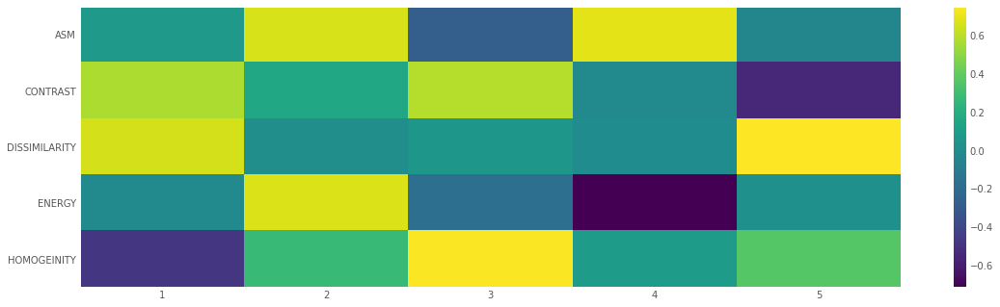

In [126]:
# Heatmap componentes
# ==============================================================================
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(17, 5))
componentes = modelo_pca.components_
plt.imshow(componentes.T, cmap='viridis', aspect='auto')
plt.yticks(range(len(df_PCA.columns)), df_PCA.columns)
plt.xticks(range(len(df_PCA.columns)), np.arange(modelo_pca.n_components_) + 1)
plt.grid(False)
plt.colorbar();

----------------------------------------------------
Porcentaje de varianza explicada por cada componente
----------------------------------------------------
[0.45038949 0.40879911 0.11343513 0.01887305 0.00850322]


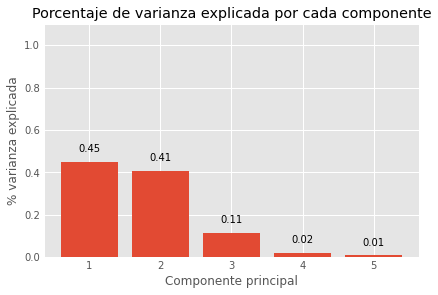

In [127]:
# Porcentaje de varianza explicada por cada componente
# ==============================================================================
print('----------------------------------------------------')
print('Porcentaje de varianza explicada por cada componente')
print('----------------------------------------------------')
print(modelo_pca.explained_variance_ratio_)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 4))
ax.bar(
    x      = np.arange(modelo_pca.n_components_) + 1,
    height = modelo_pca.explained_variance_ratio_
)

for x, y in zip(np.arange(len(df.columns)) + 1, modelo_pca.explained_variance_ratio_):
    label = round(y, 2)
    ax.annotate(
        label,
        (x,y),
        textcoords="offset points",
        xytext=(0,10),
        ha='center'
    )

ax.set_xticks(np.arange(modelo_pca.n_components_) + 1)
ax.set_ylim(0, 1.1)
ax.set_title('Porcentaje de varianza explicada por cada componente')
ax.set_xlabel('Componente principal')
ax.set_ylabel('% varianza explicada');

# Prueba con los resultados de PCA

In [184]:
df

,ASM,CONTRAST,CORRELATION,DISSIMILARITY,ENERGY,HOMOGEINITY,TARGET
0,0.004839,13.482903,0.997581,0.815640,0.069560,0.696242,0
1,0.002999,2.480040,0.999107,0.719861,0.054761,0.690258,0
2,0.000415,50.504538,0.970078,5.361780,0.020382,0.178455,0
3,0.002563,14.356492,0.996987,1.520441,0.050628,0.524019,0
4,0.009462,77.208992,0.989455,3.090761,0.097271,0.369309,0
...,...,...,...,...,...,...,...
598,0.003786,11.729562,0.998533,1.954031,0.061531,0.480609,2
599,0.010204,41.006168,0.995272,2.042834,0.101017,0.470882,2
600,0.001639,38.170450,0.993423,2.496610,0.040487,0.381141,2
601,0.001057,16.282383,0.996520,1.637463,0.032513,0.512064,2


In [186]:
df1 = df.drop(['CORRELATION', 'ENERGY', 'HOMOGEINITY', 'TARGET'], axis=1)

In [187]:
df1

,ASM,CONTRAST,DISSIMILARITY
0,0.004839,13.482903,0.815640
1,0.002999,2.480040,0.719861
2,0.000415,50.504538,5.361780
3,0.002563,14.356492,1.520441
4,0.009462,77.208992,3.090761
...,...,...,...
598,0.003786,11.729562,1.954031
599,0.010204,41.006168,2.042834
600,0.001639,38.170450,2.496610
601,0.001057,16.282383,1.637463


In [188]:
X_new = df1.iloc[:,:].to_numpy()
y_new = df.iloc[:,-1].to_numpy()

In [189]:
scaler = preprocessing.RobustScaler()
X_robust = scaler.fit_transform(X_new)
robust_df = pd.DataFrame(X_robust, columns =['ASM', 'CONTRAST', 'DISSIMILARITY'])#

#prueba para vel el comportamiento de los datos con ambos metodos
scaler = preprocessing.StandardScaler()
X_scaler = scaler.fit_transform(X_new)
scaler_df = pd.DataFrame(X_scaler, columns =['ASM', 'CONTRAST', 'DISSIMILARITY'])#, 'DISSIMILARITY'

In [190]:
robust_df

,ASM,CONTRAST,DISSIMILARITY
0,0.200561,-0.358286,-1.501976
1,-0.055449,-0.929385,-1.625403
2,-0.414916,1.563306,4.356468
3,-0.116058,-0.312943,-0.593726
4,0.843869,2.949390,1.429889
...,...,...,...
598,0.054109,-0.449292,-0.034973
599,0.947207,1.070298,0.079463
600,-0.244632,0.923111,0.664228
601,-0.325631,-0.212980,-0.442923


**StandardScaler** follows Standard Normal Distribution (SND). Therefore, it makes **mean = 0** and scales the data to **unit variance**. 

**MinMaxScaler** scales all the data features in the range [0, 1] or else in the range [-1, 1] if there are negative values in the dataset. This scaling compresses all the inliers in the narrow range [0, 0.005]. 

In the presence of outliers, **StandardScaler** does not guarantee balanced feature scales, due to the influence of the outliers while computing the empirical mean and standard deviation. This leads to the shrinkage in the range of the feature values. 

By using **RobustScaler()**, we can remove the outliers and then use either *StandardScaler* or *MinMaxScaler* for preprocessing the dataset. 

<AxesSubplot:title={'center':'After Standard Scaling'}, xlabel='ASM', ylabel='Density'>

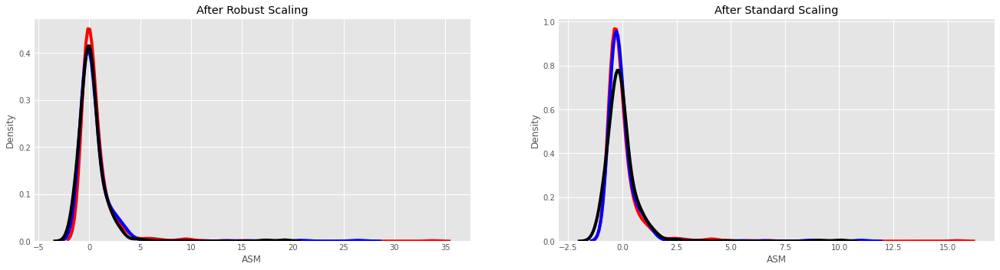

In [191]:
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize =(20, 5))

ax1.set_title('After Robust Scaling') 
sns.kdeplot(robust_df['ASM'], ax=ax1, color ='r')
sns.kdeplot(robust_df['CONTRAST'], ax=ax1, color ='b')
sns.kdeplot(robust_df['DISSIMILARITY'], ax=ax1, color ='k')

ax2.set_title('After Standard Scaling') 
sns.kdeplot(scaler_df['ASM'], ax=ax2, color ='r')
sns.kdeplot(scaler_df['CONTRAST'], ax=ax2, color ='b')
sns.kdeplot(scaler_df['DISSIMILARITY'], ax=ax2, color ='k')
# set_title('After Robust Scaling')

In [192]:
# We partition our dataset into a training set and a test set (20%).
X_train, X_test, y_train, y_test = train_test_split(X_robust, y_new, test_size=0.2, random_state=21)

# SVM with PCA

In [193]:
clf = SVC(random_state=21)

In [194]:
clf.fit(X_train, y_train)

SVC(random_state=21)

In [195]:
y_pred_svm = clf.predict(X_test)

In [196]:
pred_values = pd.DataFrame({'Actual value': y_test, 'Predicted value': y_pred_svm})
pred_values.head(20)

,Actual value,Predicted value
0,2,1
1,1,0
2,1,1
3,1,1
4,2,1
5,0,2
6,2,1
7,0,0
8,1,1
9,2,2


In [197]:
exactitud_svm = round(accuracy_score(y_test, y_pred_svm), 4)
precision_svm = round(precision_score(y_test, y_pred_svm, average='weighted'), 4)
sensibilidad_svm = round(recall_score(y_test, y_pred_svm, average='weighted'), 4)
puntaje_svm = round(f1_score(y_test, y_pred_svm, average='weighted'), 4)

print(f'exactitud: {exactitud_svm}\nprecision: {precision_svm}\nsensibilidad: {sensibilidad_svm}\nf1 score: {puntaje_svm}')

exactitud: 0.6033
precision: 0.6325
sensibilidad: 0.6033
f1 score: 0.5996


In [176]:
params_grid_svm = {  
               'kernel':['linear','rbf', 'sigmoid'], #'linear', 'rbf' 'poly', 
               'degree':[1, 2, 3],
               'gamma':['scale', 'auto'],
               'coef0':[0.0, 0.25, 0.50, 0.75],
               'tol':[1e-3, 1e-4, 1e-5],
               'C':[0.25, 0.5, 0.75, 1.0]}
grid_svm = GridSearchCV(clf, params_grid_svm, refit = True, verbose = 3,n_jobs=1)
grid_svm.fit(X_train, y_train)

Fitting 5 folds for each of 864 candidates, totalling 4320 fits
[CV 1/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.001;, score=0.474 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.001;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.001;, score=0.490 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.001;, score=0.458 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.474 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.490 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.

[CV 5/5] END C=0.25, coef0=0.0, degree=1, gamma=auto, kernel=rbf, tol=1e-05;, score=0.479 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.0, degree=1, gamma=auto, kernel=sigmoid, tol=0.001;, score=0.464 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.0, degree=1, gamma=auto, kernel=sigmoid, tol=0.001;, score=0.536 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.0, degree=1, gamma=auto, kernel=sigmoid, tol=0.001;, score=0.438 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.0, degree=1, gamma=auto, kernel=sigmoid, tol=0.001;, score=0.406 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.0, degree=1, gamma=auto, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.0, degree=1, gamma=auto, kernel=sigmoid, tol=0.0001;, score=0.464 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.0, degree=1, gamma=auto, kernel=sigmoid, tol=0.0001;, score=0.536 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.0, degree=1, gamma=auto, kernel=sigmoid, tol=0.0001;, score=0.438 tot

[CV 3/5] END C=0.25, coef0=0.0, degree=2, gamma=auto, kernel=rbf, tol=0.001;, score=0.521 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.0, degree=2, gamma=auto, kernel=rbf, tol=0.001;, score=0.490 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.0, degree=2, gamma=auto, kernel=rbf, tol=0.001;, score=0.479 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.0, degree=2, gamma=auto, kernel=rbf, tol=0.0001;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.0, degree=2, gamma=auto, kernel=rbf, tol=0.0001;, score=0.485 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.0, degree=2, gamma=auto, kernel=rbf, tol=0.0001;, score=0.521 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.0, degree=2, gamma=auto, kernel=rbf, tol=0.0001;, score=0.490 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.0, degree=2, gamma=auto, kernel=rbf, tol=0.0001;, score=0.479 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.0, degree=2, gamma=auto, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 2/5] END C

[CV 5/5] END C=0.25, coef0=0.0, degree=3, gamma=auto, kernel=rbf, tol=0.001;, score=0.479 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.0, degree=3, gamma=auto, kernel=rbf, tol=0.0001;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.0, degree=3, gamma=auto, kernel=rbf, tol=0.0001;, score=0.485 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.0, degree=3, gamma=auto, kernel=rbf, tol=0.0001;, score=0.521 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.0, degree=3, gamma=auto, kernel=rbf, tol=0.0001;, score=0.490 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.0, degree=3, gamma=auto, kernel=rbf, tol=0.0001;, score=0.479 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.0, degree=3, gamma=auto, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.0, degree=3, gamma=auto, kernel=rbf, tol=1e-05;, score=0.485 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.0, degree=3, gamma=auto, kernel=rbf, tol=1e-05;, score=0.521 total time=   0.0s
[CV 4/5] END C

[CV 5/5] END C=0.25, coef0=0.25, degree=1, gamma=auto, kernel=linear, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.25, degree=1, gamma=auto, kernel=rbf, tol=0.001;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.25, degree=1, gamma=auto, kernel=rbf, tol=0.001;, score=0.485 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.25, degree=1, gamma=auto, kernel=rbf, tol=0.001;, score=0.521 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.25, degree=1, gamma=auto, kernel=rbf, tol=0.001;, score=0.490 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.25, degree=1, gamma=auto, kernel=rbf, tol=0.001;, score=0.479 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.25, degree=1, gamma=auto, kernel=rbf, tol=0.0001;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.25, degree=1, gamma=auto, kernel=rbf, tol=0.0001;, score=0.485 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.25, degree=1, gamma=auto, kernel=rbf, tol=0.0001;, score=0.521 total time=   0.0s
[CV 

[CV 3/5] END C=0.25, coef0=0.25, degree=2, gamma=auto, kernel=rbf, tol=0.001;, score=0.521 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.25, degree=2, gamma=auto, kernel=rbf, tol=0.001;, score=0.490 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.25, degree=2, gamma=auto, kernel=rbf, tol=0.001;, score=0.479 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.25, degree=2, gamma=auto, kernel=rbf, tol=0.0001;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.25, degree=2, gamma=auto, kernel=rbf, tol=0.0001;, score=0.485 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.25, degree=2, gamma=auto, kernel=rbf, tol=0.0001;, score=0.521 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.25, degree=2, gamma=auto, kernel=rbf, tol=0.0001;, score=0.490 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.25, degree=2, gamma=auto, kernel=rbf, tol=0.0001;, score=0.479 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.25, degree=2, gamma=auto, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 2

[CV 2/5] END C=0.25, coef0=0.25, degree=3, gamma=auto, kernel=linear, tol=0.001;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.25, degree=3, gamma=auto, kernel=linear, tol=0.001;, score=0.490 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.25, degree=3, gamma=auto, kernel=linear, tol=0.001;, score=0.458 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.25, degree=3, gamma=auto, kernel=linear, tol=0.001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.25, degree=3, gamma=auto, kernel=linear, tol=0.0001;, score=0.474 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.25, degree=3, gamma=auto, kernel=linear, tol=0.0001;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.25, degree=3, gamma=auto, kernel=linear, tol=0.0001;, score=0.490 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.25, degree=3, gamma=auto, kernel=linear, tol=0.0001;, score=0.458 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.25, degree=3, gamma=auto, kernel=linear, tol=0.0001;, score=0.4

[CV 4/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.406 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.381 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.443 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.438 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.396 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.406 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=sigmoid, tol=1e-05;, score=0.381 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.5, degree=1, gamma=scale, kernel=sigmoid, tol=1e-05;, 

[CV 2/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.485 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.521 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.490 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.438 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.485 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.521 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.490 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.438 total time=   0.0s
[CV 1/

[CV 3/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.490 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.458 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.474 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.454 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.490 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.458 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.557 to

[CV 2/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.485 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.521 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.490 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.438 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.485 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.521 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.490 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.438 total time=   0

[CV 5/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.485 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.521 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.490 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.438 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.485 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.521 total time=   

[CV 4/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.490 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.438 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.485 total time=   0.0s
[CV 3/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.521 total time=   0.0s
[CV 4/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.490 total time=   0.0s
[CV 5/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.438 total time=   0.0s
[CV 1/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.25, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.485 total time=   0

[CV 3/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.001;, score=0.500 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.001;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.485 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.443 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.500 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.485 total 

[CV 3/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.500 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.485 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.443 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.500 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.598 total time=

[CV 5/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.598 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.531 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.479 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.598 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.531 total time=   0.0s
[CV 4/5] END 

[CV 2/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.531 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.479 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.598 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.531 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.479 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/

[CV 2/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.531 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.479 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.598 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.531 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.479 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1

[CV 4/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=linear, tol=0.001;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=linear, tol=0.001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.485 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.443 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.500 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.485 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.25, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.4

[CV 5/5] END C=0.5, coef0=0.25, degree=3, gamma=auto, kernel=sigmoid, tol=0.001;, score=0.354 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.25, degree=3, gamma=auto, kernel=sigmoid, tol=0.0001;, score=0.361 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.25, degree=3, gamma=auto, kernel=sigmoid, tol=0.0001;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.25, degree=3, gamma=auto, kernel=sigmoid, tol=0.0001;, score=0.406 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.25, degree=3, gamma=auto, kernel=sigmoid, tol=0.0001;, score=0.333 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.25, degree=3, gamma=auto, kernel=sigmoid, tol=0.0001;, score=0.354 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.25, degree=3, gamma=auto, kernel=sigmoid, tol=1e-05;, score=0.361 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.25, degree=3, gamma=auto, kernel=sigmoid, tol=1e-05;, score=0.402 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.25, degree=3, gamma=auto, kernel=sigmoid, tol=1e-05;, score=0.4

[CV 5/5] END C=0.5, coef0=0.5, degree=1, gamma=auto, kernel=rbf, tol=0.001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.5, degree=1, gamma=auto, kernel=rbf, tol=0.0001;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.5, degree=1, gamma=auto, kernel=rbf, tol=0.0001;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.5, degree=1, gamma=auto, kernel=rbf, tol=0.0001;, score=0.531 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.5, degree=1, gamma=auto, kernel=rbf, tol=0.0001;, score=0.490 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.5, degree=1, gamma=auto, kernel=rbf, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.5, degree=1, gamma=auto, kernel=rbf, tol=1e-05;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.5, degree=1, gamma=auto, kernel=rbf, tol=1e-05;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.5, degree=1, gamma=auto, kernel=rbf, tol=1e-05;, score=0.531 total time=   0.0s
[CV 4/5] END C=0.5, coe

[CV 1/5] END C=0.5, coef0=0.5, degree=2, gamma=auto, kernel=linear, tol=1e-05;, score=0.485 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.5, degree=2, gamma=auto, kernel=linear, tol=1e-05;, score=0.443 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.5, degree=2, gamma=auto, kernel=linear, tol=1e-05;, score=0.500 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.5, degree=2, gamma=auto, kernel=linear, tol=1e-05;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.5, degree=2, gamma=auto, kernel=linear, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.5, degree=2, gamma=auto, kernel=rbf, tol=0.001;, score=0.557 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.5, degree=2, gamma=auto, kernel=rbf, tol=0.001;, score=0.495 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.5, degree=2, gamma=auto, kernel=rbf, tol=0.001;, score=0.531 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.5, degree=2, gamma=auto, kernel=rbf, tol=0.001;, score=0.490 total time=   0.0s
[CV 5/5] END 

[CV 2/5] END C=0.5, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=1e-05;, score=0.381 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=1e-05;, score=0.292 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=1e-05;, score=0.281 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.5, degree=3, gamma=scale, kernel=sigmoid, tol=1e-05;, score=0.271 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.5, degree=3, gamma=auto, kernel=linear, tol=0.001;, score=0.485 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.5, degree=3, gamma=auto, kernel=linear, tol=0.001;, score=0.443 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.5, degree=3, gamma=auto, kernel=linear, tol=0.001;, score=0.500 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.5, degree=3, gamma=auto, kernel=linear, tol=0.001;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.5, degree=3, gamma=auto, kernel=linear, tol=0.001;, score=0.427 total time= 

[CV 1/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.216 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.340 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.312 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.250 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.281 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.216 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.340 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.312 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.75, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, s

[CV 1/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.598 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.531 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.479 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.598 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.531 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.75, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.479 total time=   0.0s
[CV 5

[CV 1/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.598 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.526 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.531 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.479 total time=   0.0s
[CV 5/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.216 total time=   0.0s
[CV 2/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.340 total time=   0.0s
[CV 3/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.312 total time=   0.0s
[CV 4/5] END C=0.5, coef0=0.75, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.250 total time=  

[CV 3/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.521 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.469 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.351 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.392 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.417 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.323 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.354 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.0, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.351 tota

[CV 1/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.351 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.392 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.417 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.323 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.354 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.351 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.392 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.417 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.0, degree=2, gamma=scale, kernel=sigmoid, tol=0.0001;, s

[CV 2/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.392 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.417 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.323 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.354 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.351 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.392 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.417 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.323 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.0, degree=3, gamma=scale, kernel=sigmoid, tol=0.0001;, 

[CV 4/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.521 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.469 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.309 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.371 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.365 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.302 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.323 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, score=0.309 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.25, degree=1, gamma=scale, kernel=sigmoid, tol=0.0001;, sc

[CV 1/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.629 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.546 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.510 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.521 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.469 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.629 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.546 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.521 total time=   0

[CV 5/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.469 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.629 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.546 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.521 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.469 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.309 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.371 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.25, degree=3, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.365 total t

[CV 3/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.510 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.485 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.443 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.629 to

[CV 4/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.629 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.546 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.510 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.521 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.469 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.629 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.546 total time=   0.0s
[C

[CV 2/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.443 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.629 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.546 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.510 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.521 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.5, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.469 total time=   0.0

[CV 5/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.485 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.443 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.629 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.546 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.75, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.510 t

[CV 2/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.443 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.510 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=linear, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.485 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.443 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.75, degree=2, gamma=scale, kernel=linear, tol=1e-05;, s

[CV 1/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=linear, tol=0.001;, score=0.485 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=linear, tol=0.001;, score=0.443 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=linear, tol=0.001;, score=0.510 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=linear, tol=0.001;, score=0.438 total time=   0.0s
[CV 5/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=linear, tol=0.001;, score=0.427 total time=   0.0s
[CV 1/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.485 total time=   0.0s
[CV 2/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.443 total time=   0.0s
[CV 3/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.510 total time=   0.0s
[CV 4/5] END C=0.75, coef0=0.75, degree=3, gamma=scale, kernel=linear, tol=0.0001;, s

[CV 4/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.438 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.485 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.443 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.438 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.639 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.526 total time=   0

[CV 4/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.438 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=linear, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.639 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.526 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.639 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 3/5] EN

[CV 2/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.526 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.639 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 1/5] END C

[CV 5/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.639 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.639 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.526 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.25, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4

[CV 2/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.526 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.309 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.361 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.281 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.292 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.25, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.302 total tim

[CV 3/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.001;, score=0.542 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.639 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.526 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.25, degree=3, gamma=scale, kernel=rbf, tol=1e-05;, score=0.639 total time=   0.0s
[CV 2

[CV 3/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.639 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.526 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.5, degree=1, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.247 total time=   0.0s
[CV 2/5] END

[CV 3/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=0.0001;, score=0.542 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.639 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.526 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=rbf, tol=1e-05;, score=0.542 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.5, degree=2, gamma=scale, kernel=sigmoid, tol=0.001;, score=0.247 total time=   0.0s
[CV 2/5] END

[CV 2/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.443 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.438 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.485 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.443 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.438 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.5, degree=3, gamma=scale, kernel=linear, tol=1e-05;, score=0.427 total t

[CV 1/5] END C=1.0, coef0=0.5, degree=3, gamma=auto, kernel=sigmoid, tol=0.0001;, score=0.216 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.5, degree=3, gamma=auto, kernel=sigmoid, tol=0.0001;, score=0.320 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.5, degree=3, gamma=auto, kernel=sigmoid, tol=0.0001;, score=0.271 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.5, degree=3, gamma=auto, kernel=sigmoid, tol=0.0001;, score=0.260 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.5, degree=3, gamma=auto, kernel=sigmoid, tol=0.0001;, score=0.229 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.5, degree=3, gamma=auto, kernel=sigmoid, tol=1e-05;, score=0.216 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.5, degree=3, gamma=auto, kernel=sigmoid, tol=1e-05;, score=0.320 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.5, degree=3, gamma=auto, kernel=sigmoid, tol=1e-05;, score=0.271 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.5, degree=3, gamma=auto, kernel=sigmoid, tol=1e-05;, score=0.260 total 

[CV 2/5] END C=1.0, coef0=0.75, degree=1, gamma=auto, kernel=rbf, tol=0.0001;, score=0.536 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.75, degree=1, gamma=auto, kernel=rbf, tol=0.0001;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.75, degree=1, gamma=auto, kernel=rbf, tol=0.0001;, score=0.552 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.75, degree=1, gamma=auto, kernel=rbf, tol=0.0001;, score=0.458 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.75, degree=1, gamma=auto, kernel=rbf, tol=1e-05;, score=0.629 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.75, degree=1, gamma=auto, kernel=rbf, tol=1e-05;, score=0.536 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.75, degree=1, gamma=auto, kernel=rbf, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.75, degree=1, gamma=auto, kernel=rbf, tol=1e-05;, score=0.552 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.75, degree=1, gamma=auto, kernel=rbf, tol=1e-05;, score=0.458 total time=   0.0s
[CV 1/5] END C=

[CV 1/5] END C=1.0, coef0=0.75, degree=2, gamma=auto, kernel=linear, tol=0.0001;, score=0.485 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.75, degree=2, gamma=auto, kernel=linear, tol=0.0001;, score=0.443 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.75, degree=2, gamma=auto, kernel=linear, tol=0.0001;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.75, degree=2, gamma=auto, kernel=linear, tol=0.0001;, score=0.438 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.75, degree=2, gamma=auto, kernel=linear, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.75, degree=2, gamma=auto, kernel=linear, tol=1e-05;, score=0.485 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.75, degree=2, gamma=auto, kernel=linear, tol=1e-05;, score=0.443 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.75, degree=2, gamma=auto, kernel=linear, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.75, degree=2, gamma=auto, kernel=linear, tol=1e-05;, score=0.438 total 

[CV 5/5] END C=1.0, coef0=0.75, degree=3, gamma=auto, kernel=linear, tol=0.0001;, score=0.427 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.75, degree=3, gamma=auto, kernel=linear, tol=1e-05;, score=0.485 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.75, degree=3, gamma=auto, kernel=linear, tol=1e-05;, score=0.443 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.75, degree=3, gamma=auto, kernel=linear, tol=1e-05;, score=0.510 total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.75, degree=3, gamma=auto, kernel=linear, tol=1e-05;, score=0.438 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.75, degree=3, gamma=auto, kernel=linear, tol=1e-05;, score=0.427 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.75, degree=3, gamma=auto, kernel=rbf, tol=0.001;, score=0.629 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.75, degree=3, gamma=auto, kernel=rbf, tol=0.001;, score=0.536 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.75, degree=3, gamma=auto, kernel=rbf, tol=0.001;, score=0.510 total time=   0.0s


GridSearchCV(estimator=SVC(random_state=21), n_jobs=1,
             param_grid={'C': [0.25, 0.5, 0.75, 1.0],
                         'coef0': [0.0, 0.25, 0.5, 0.75], 'degree': [1, 2, 3],
                         'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'rbf', 'sigmoid'],
                         'tol': [0.001, 0.0001, 1e-05]},
             verbose=3)

In [177]:
y_pred = grid_svm.predict(X_test)

In [178]:
pred_values = pd.DataFrame({'Actual value': y_test, 'Predicted value': y_pred})
pred_values.head(20)

,Actual value,Predicted value
0,2,0
1,1,0
2,1,0
3,1,0
4,2,1
5,0,2
6,2,1
7,0,0
8,1,0
9,2,0


In [179]:
exactitud_svm = round(accuracy_score(y_test, y_pred), 4)
precision_svm = round(precision_score(y_test, y_pred, average='weighted'), 4)
sensibilidad_svm = round(recall_score(y_test, y_pred, average='weighted'), 4)
puntaje_svm = round(f1_score(y_test, y_pred, average='weighted'), 4)

print(f'exactitud: {exactitud_svm}\nprecision: {precision_svm}\nsensibilidad: {sensibilidad_svm}\nf1 score: {puntaje_svm}')

exactitud: 0.5455
precision: 0.5513
sensibilidad: 0.5455
f1 score: 0.5315


# Knn with PCA

In [180]:
# train the classifier
classifier = KNeighborsClassifier(n_neighbors=3)
classifier.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [181]:
y_pred_ = classifier.predict(X_test)

In [182]:
pred_values = pd.DataFrame({'Actual value': y_test, 'Predicted value': y_pred_})
pred_values.head(100)

,Actual value,Predicted value
0,2,2
1,1,0
2,1,0
3,1,1
4,2,2
...,...,...
95,0,1
96,1,0
97,2,2
98,0,0


In [183]:
exactitud = round(accuracy_score(y_test, y_pred_), 4)
precision = round(precision_score(y_test, y_pred_, average='weighted'), 4)
sensibilidad = round(recall_score(y_test, y_pred_, average='weighted'), 4)
puntaje = round(f1_score(y_test, y_pred_, average='weighted'), 4)

print(f'exactitud: {exactitud_svm}\nprecision: {precision_svm}\nsensibilidad: {sensibilidad_svm}\nf1 score: {puntaje_svm}')

exactitud: 0.5455
precision: 0.5513
sensibilidad: 0.5455
f1 score: 0.5315


In [157]:
params_grid_ = {  
               'n_neighbors':[n for n in range(3, 150)], 
               'weights':['uniform', 'distance'],
               'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute'],
               'leaf_size':[20, 30, 40],
               'metric': ['chebyshev', 'manhattan', 'minkowski']}
grid_ = GridSearchCV(classifier, params_grid_, refit = True, verbose = 3,n_jobs=1)
grid_.fit(X_train, y_train)

Fitting 5 folds for each of 10584 candidates, totalling 52920 fits
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.677 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebys

[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=14, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=14, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=14, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=14, weights=distance;, score=0.667 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=14, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=14, weights=distance;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=15, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=15, weights=uniform;, score=0.619 total 

[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=26, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=26, weights=uniform;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=26, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=26, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=26, weights=distance;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=26, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=26, weights=distance;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.639 total 

[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=38, weights=uniform;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=38, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=38, weights=uniform;, score=0.500 total 

[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=47, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=47, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=47, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=47, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=47, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=48, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=48, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=48, weights=uniform;, score=0.500 total 

[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=57, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=57, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=57, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=57, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=57, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=57, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=57, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=58, weights=uniform;, score=0.567 total 

[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=66, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=66, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=66, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=66, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=66, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=67, weights=uniform;, score=0.557 total 

[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.448 total 

[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=82, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=82, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=82, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=82, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.552 total t

[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=90, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=90, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=90, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=90, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=90, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=90, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=91, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=91, weights=uniform;, score=0.495 total 

[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=98, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=98, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=98, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=98, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=98, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=99, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=99, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=99, weights=uniform;, score=0.448 total 

[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=106, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=106, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=106, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=106, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=106, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=106, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=107, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=107, weights=uniform;, score=0.48

[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=114, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=114, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=114, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=114, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=114, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=114, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=114, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=114, weights=distance;, score=0.62

[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=120, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=120, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=120, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=121, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=121, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=121, weights=uniform;, score=0.385 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=121, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=121, weights=uniform;, score=0.469 

[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=127, weights=distance;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=128, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=128, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=128, weights=uniform;, score=0.385 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=128, weights=uniform;, score=0.448 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=128, weights=uniform;, score=0.458 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=128, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=128, weights=distance;, score=0.577 

[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=134, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=134, weights=distance;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.448 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.438 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=135, weights=distance;, score=0.608 

[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=uniform;, score=0.438 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=distance;, score=0.521 

[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=uniform;, score=0.458 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.521

[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=13, weights=distance;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=14, weights=uniform;, score=0.722 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=14, weights=uniform;, score=0.701 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=14, weights=uniform;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=14, weights=uniform;, score=0.604 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=14, weights=uniform;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=14, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=14, weights=distance;, score=0.701 total ti

[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=distance;, score=0.670 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=26, weights=distance;, score=0.635 total ti

[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.701 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.542 total 

[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=48, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=48, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=48, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=48, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=48, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=49, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=49, weights=uniform;, score=0.577 total 

[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=58, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=58, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=58, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=58, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=58, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=59, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=59, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=59, weights=uniform;, score=0.552 total 

[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=68, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=68, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=68, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=68, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=68, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=68, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=69, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=69, weights=uniform;, score=0.619 total 

[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=77, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=77, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=78, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=78, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=78, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=78, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=78, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=78, weights=distance;, score=0.691 total ti

[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=87, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=87, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=87, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=87, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=87, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=87, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=87, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=87, weights=distance;, score=0.521 total t

[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=96, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=96, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=96, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=96, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=96, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=96, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=96, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=96, weights=distance;, score=0.542 total ti

[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=104, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=104, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=105, weights=distance;, score=0.680 

[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=113, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=113, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=113, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=113, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=113, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=113, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=113, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=114, weights=uniform;, score=0.58

[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=121, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=121, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=121, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=121, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=121, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.52

[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=129, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=129, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=129, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=130, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=130, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=130, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=130, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=130, weights=uniform;, score=0.510 

[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=137, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=137, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=137, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=137, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=137, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=138, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=138, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=138, weights=uniform;, score=0.54

[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=145, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=145, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=145, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=145, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=145, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=145, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=145, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=146, weights=uniform;, score=0.58

[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=8, weights=uniform;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=8, weights=uniform;, score=0.670 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=8, weights=uniform;, score=0.656 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=8, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=8, weights=uniform;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=8, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=8, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=8, weights=distance;, score=0.688 total time=   0.

[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=20, weights=uniform;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=20, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=20, weights=uniform;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=20, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=20, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=20, weights=distance;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=20, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=20, weights=distance;, score=0.760 total 

[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=31, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=31, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=31, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=31, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=31, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=32, weights=uniform;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=32, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=32, weights=uniform;, score=0.542 total 

[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=42, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=42, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=42, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=42, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=42, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=43, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=43, weights=uniform;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=43, weights=uniform;, score=0.542 total 

[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=53, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=53, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=53, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=53, weights=distance;, score=0.531 total t

[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=63, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=63, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=63, weights=distance;, score=0.531 total ti

[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=72, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=72, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=72, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=72, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=72, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.490 total 

[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=81, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=81, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=81, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.583 total ti

[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=89, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=89, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=89, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=89, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.542 total t

[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=98, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=99, weights=uniform;, score=0.536 total 

[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=107, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=107, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=107, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=107, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=107, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=107, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=107, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=107, weights=distance;, score=0.521 

[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=115, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=115, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=115, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=115, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=115, weights=distance;, score=0.64

[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=123, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=123, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=123, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=123, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=123, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=123, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=123, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=124, weights=uniform;, score=0.56

[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=131, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=131, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=131, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=131, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=131, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=131, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=132, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=132, weights=uniform;, score=0.51

[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=139, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=139, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=139, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=139, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=139, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=139, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=139, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=140, weights=uniform;, score=0.55

[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=146, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.479 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=147, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=147, weights=distance;, score=0.598 

[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=10, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=10, weights=uniform;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.698 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=10, weights=distance;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=11, weights=uniform;, score=0.660 total 

[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=22, weights=uniform;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=23, weights=uniform;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=23, weights=uniform;, score=0.629 total 

[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=33, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=34, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=34, weights=uniform;, score=0.598 total 

[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=44, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=44, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=44, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=44, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=44, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=44, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=44, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=44, weights=distance;, score=0.510 total ti

[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=54, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=54, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=54, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=54, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=54, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=54, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=54, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=54, weights=distance;, score=0.677 total 

[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=64, weights=distance;, score=0.542 total t

[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=73, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.588 total 

[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=82, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=uniform;, score=0.479 total t

[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=92, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=92, weights=uniform;, score=0.485 total 

[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=uniform;, score=0.500 tot

[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.531 

[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.608 

[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=123, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=123, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=123, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=123, weights=distance;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.385 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.490

[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=uniform;, score=0.448 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.52

[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.458 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.438 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.531

[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.42

[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=10, weights=uniform;, score=0.670 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=10, weights=uniform;, score=0.625 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=10, weights=uniform;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=10, weights=uniform;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=10, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=10, weights=distance;, score=0.701 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=10, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=10, weights=distance;, score=0.594 total t

[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=22, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=22, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=22, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=22, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=22, weights=distance;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=23, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=23, weights=uniform;, score=0.649 total 

[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=34, weights=uniform;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=34, weights=uniform;, score=0.691 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=34, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=34, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=34, weights=uniform;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=34, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=34, weights=distance;, score=0.691 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=34, weights=distance;, score=0.583 total ti

[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=44, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=44, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=45, weights=uniform;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=45, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=45, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=45, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=45, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=45, weights=distance;, score=0.722 total ti

[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=54, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=55, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=55, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=55, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=55, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=55, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=55, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=55, weights=distance;, score=0.660 total ti

[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=65, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=65, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=65, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=65, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=65, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=65, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=65, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=65, weights=distance;, score=0.698 total 

[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=75, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=75, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=75, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=75, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=75, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=75, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=75, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=75, weights=distance;, score=0.531 total t

[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=84, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=84, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=84, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=84, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=84, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.521 total 

[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=93, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=93, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=93, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=93, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=93, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=93, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.588 total 

[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=102, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=102, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=102, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=102, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=102, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=102, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=102, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.60

[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=111, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=111, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=111, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=111, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=111, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=111, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=111, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=111, weights=distance;, score=0.62

[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=119, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=119, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=119, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=119, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=119, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=120, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=120, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=120, weights=uniform;, score=0.51

[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=127, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=128, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=128, weights=distance;, score=0.619 

[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=135, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=136, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=136, weights=distance;, score=0.608 

[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=143, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=144, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=144, weights=distance;, score=0.608 

[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=5, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=6, weights=distance;, score=0.722 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=6, weights=distance;, score=0.649 total time=   0.

[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=18, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=18, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=18, weights=distance;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=18, weights=distance;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=18, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=19, weights=uniform;, score=0.670 total 

[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=30, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=30, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=30, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=30, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=30, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=30, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=30, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=30, weights=distance;, score=0.531 total t

[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=41, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=41, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=41, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=41, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=41, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=41, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=41, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=41, weights=distance;, score=0.521 total t

[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=51, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=51, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=51, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=52, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=52, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=52, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=52, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=52, weights=uniform;, score=0.625 total ti

[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=62, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=62, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=62, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=62, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=62, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=62, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=62, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=62, weights=distance;, score=0.531 total ti

[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=72, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=72, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=72, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=72, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=72, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=72, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=72, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=72, weights=distance;, score=0.521 total ti

[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=81, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=81, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=81, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=81, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=81, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.536 total 

[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=90, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=90, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=90, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=90, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=90, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=91, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=91, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=91, weights=uniform;, score=0.479 total 

[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=99, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=99, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=99, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=99, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.531 tot

[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=108, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=108, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=108, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=108, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=108, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=108, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=109, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=109, weights=uniform;, score=0.51

[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=117, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=117, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=117, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=117, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=117, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=117, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=117, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=117, weights=distance;, score=0.521 

[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=125, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=125, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=125, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=125, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=125, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=125, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=125, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=125, weights=distance;, score=0.63

[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=133, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=133, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=133, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=133, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=133, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=133, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=133, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=133, weights=distance;, score=0.63

[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=141, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=141, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=141, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=141, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=141, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=141, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=141, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=141, weights=distance;, score=0.63

[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=149, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=149, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=149, weights=distance;, score=0.542 

[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=uniform;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=uniform;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=distance;, score=0.552 total t

[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=24, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=24, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=24, weights=distance;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=24, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=24, weights=distance;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=25, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=25, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=25, weights=uniform;, score=0.552 total 

[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=36, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=36, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=36, weights=uniform;, score=0.510 total 

[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=distance;, score=0.521 total ti

[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=distance;, score=0.531 total t

[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=distance;, score=0.521 total ti

[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=distance;, score=0.646 total 

[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.542 total t

[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=93, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=93, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=93, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=93, weights=uniform;, score=0.521 total t

[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.500 

[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.510 

[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=116, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.50

[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.385 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.469 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.542

[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.448 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.448 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=distance;, score=0.577 

[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=140, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=140, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=140, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=140, weights=uniform;, score=0.469

[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.458 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=147, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=147, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=147, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=147, weights=distance;, score=0.531

[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=10, weights=uniform;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=10, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=10, weights=distance;, score=0.701 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=10, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=10, weights=distance;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=10, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=11, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=11, weights=uniform;, score=0.660 total 

[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=22, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=22, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=22, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=22, weights=distance;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=23, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=23, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=23, weights=uniform;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=23, weights=uniform;, score=0.531 total t

[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=34, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=34, weights=uniform;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=34, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=34, weights=distance;, score=0.691 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=34, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=34, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=34, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.670 total 

[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=45, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=45, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=45, weights=distance;, score=0.722 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=45, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=45, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=45, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=45, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=46, weights=uniform;, score=0.660 total 

[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=55, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=56, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=56, weights=distance;, score=0.660 total ti

[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=66, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=66, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=66, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=66, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=66, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=66, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=66, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=66, weights=distance;, score=0.521 total t

[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=75, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=75, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=76, weights=distance;, score=0.680 total ti

[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=85, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=85, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=85, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=85, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=85, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=86, weights=uniform;, score=0.567 total 

[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=94, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=94, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=94, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=94, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=94, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=95, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=95, weights=uniform;, score=0.577 total 

[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=103, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=103, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=103, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=103, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=103, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=104, weights=uniform;, score=0.61

[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=112, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=112, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=112, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=112, weights=distance;, score=0.573

[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=120, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=120, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=120, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=120, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=120, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=121, weights=uniform;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=121, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=121, weights=uniform;, score=0.53

[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=128, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=128, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=128, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=128, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=128, weights=distance;, score=0.62

[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.542 

[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=143, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=143, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=144, weights=distance;, score=0.649 

[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.583 total time=   0

[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=12, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=12, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=12, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=12, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=12, weights=distance;, score=0.740 total 

[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=24, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=24, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=24, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=24, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=24, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=24, weights=distance;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=24, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=24, weights=distance;, score=0.729 total 

[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=35, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=35, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=35, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=35, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=35, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=36, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=36, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=36, weights=uniform;, score=0.531 total 

[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=46, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=46, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=46, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=46, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=46, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=47, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=47, weights=uniform;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=47, weights=uniform;, score=0.531 total 

[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=57, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=57, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=57, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=57, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=57, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=57, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=57, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=57, weights=distance;, score=0.698 total 

[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=67, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=67, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=67, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=67, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=67, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=67, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=67, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=68, weights=uniform;, score=0.567 total 

[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=77, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=77, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=77, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=77, weights=distance;, score=0.490 total t

[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=86, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=86, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=86, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=86, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=86, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.500 total 

[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=95, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=95, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=95, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=95, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=96, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=96, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=96, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=96, weights=uniform;, score=0.552 total t

[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=104, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=104, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=104, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=104, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=104, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=104, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=105, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=105, weights=uniform;, score=0.52

[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=113, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=113, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=113, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=113, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=113, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=113, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=113, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=113, weights=distance;, score=0.510

[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=121, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=121, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=121, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=121, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=121, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=122, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=122, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=122, weights=uniform;, score=0.45

[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=129, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=129, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=129, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=130, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=130, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=130, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=130, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=130, weights=uniform;, score=0.510 

[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=137, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=137, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=138, weights=distance;, score=0.639 

[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=145, weights=uniform;, score=0.479 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=145, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=145, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=145, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=145, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=145, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=146, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=146, weights=uniform;, score=0.50

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=7, weights=distance;, score=0.677 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=7, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=7, weights=distance;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=8, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=8, weights=uniform;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=8, weights=uniform;, score=0.667 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=8, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=8, weight

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=18, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=19, weights=uniform;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=19, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=19, weights=uniform;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=19, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=19, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=19, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=19,

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=29, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=29, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=29, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=29, weights=distance;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=29, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=29, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=30, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=39, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=39, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=39, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=40, weights=uniform;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=40, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=40, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=40, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=40

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=49, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=49, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=49, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=49, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=49, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=49, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=49, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=58, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=58, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=59, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=59, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=59, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=59, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=59, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=59,

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=68, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=68, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=68, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=68, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=68, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=68, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=68, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=68

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=77, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=77, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=77, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=77, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=77, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=77, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=77, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=77

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=86, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=86,

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=93, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=93, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=93, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=93, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=94, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=9

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=102, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=102, weights=uniform;, score=0.464 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=102, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neig

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=109, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=110, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighb

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=118, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=118, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=118, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=118, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neigh

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=125, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=125, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=125, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=125, weights=distance;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=126, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=126, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=126, weights=uniform;, score=0.375 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neig

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=133, weights=uniform;, score=0.396 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=133, weights=uniform;, score=0.458 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=133, weights=uniform;, score=0.427 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=133, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=133, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=133, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=133, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neig

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=140, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=140, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=140, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=140, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=140, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=141, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=141, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_nei

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=147, weights=distance;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=148, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=148, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=148, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=148, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=148, weights=uniform;, score=0.448 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=148, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighb

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=11, weights=distance;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=11, weights=distance;, score=0.781 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=12, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=12, weights=uniform;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=12, weights=uniform;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=12, weights=uniform;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=12, weights=uniform;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=12,

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=23, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=23, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=23, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=23, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=24, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=24, weights=uniform;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=24, weights=uniform;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=2

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=34, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.691 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=35, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=35, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=35,

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=45, weights=distance;, score=0.722 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=45, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=45, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=45, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=45, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=46, weights=uniform;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=46, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=55, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=56, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=56, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=56,

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=65, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=65, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=65, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=65, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=66, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=66, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=66, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=6

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=75, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=75, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=75, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=75, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=75, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=75, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=75, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=7

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=84, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=84, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=84, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=84, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=8

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=93, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=93, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=93, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=93, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=93, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=102, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=102, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=102, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=102, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=102, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=102, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=102, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neig

[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=110, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=110, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=110, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neigh

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neigh

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=127, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=127, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=127, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=127, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=127, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_nei

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=135, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=135, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=135, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=135, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=135, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=135, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_nei

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=143, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=143, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=143, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=143, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=143, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=143, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=143, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_nei

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=4, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=4, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=4, weights=distance;, score=0.656 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=4, weights=distance;, score=0.604 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=4, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=5, weights=uniform;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=5, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=5, weig

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=11, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=11, weights=uniform;, score=0.677 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=11, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=11, weights=uniform;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=11, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=11, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=11, weights=distance;, score=0.667 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=11

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=23, weights=uniform;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=23, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=23, weights=uniform;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=23, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=23, weights=uniform;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=23, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=23, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=23,

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=34, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=34, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=34, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=34, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=34, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=34, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=34, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=45, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=45, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=45, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=45, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=45, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=45, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=45, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=45

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=54, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=55, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=55, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=55, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=55, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=55, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=55, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=55,

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=64, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=64, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=64, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=64, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=65, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=65, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=65, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=6

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=74, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=74, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=74, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=74, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=74, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=74, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=74, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=83, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=83, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=84, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=84,

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=92, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=93, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=93, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=93, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=93, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=93, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=93, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=93,

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=101, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=102, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=102, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=102, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=102, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=102, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=102, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighb

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=110, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=110, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=110, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=110, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=110, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=110, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=111, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_nei

[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighb

[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=127, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=127, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=127, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=127, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=127, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=127, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=128, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_nei

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=135, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=135, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=135, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=135, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=136, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=136, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=136, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neig

[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=143, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=143, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=143, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=143, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neig

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=uniform;, score=0.719 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=uniform;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=uniform;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=distance;, score=0.677 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, weigh

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=16, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=16, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=16, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=16, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=16, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=16, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=17, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=27

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=3

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=47, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=47, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=47, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=47, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=47, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=47, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=47, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=4

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=56, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=56, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=56, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=56, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=56, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=56, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=57, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=65, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=6

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=74, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=83, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=91, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=92, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=92, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=92, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=92, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=92, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=92,

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neig

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neig

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_nei

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.385 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.469 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neigh

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.448 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neigh

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.458 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.438 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_nei

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neigh

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=9, weights=uniform;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=9, weights=uniform;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=9, weights=uniform;, score=0.656 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=9, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=9, weights=uniform;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=9, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=9, weights=distance;, score=0.691 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=9, weights

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=20, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=20, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=20, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=21, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=21, weights=uniform;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=21, weights=uniform;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=21, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=21

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=32, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=32, weights=uniform;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=32, weights=uniform;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=32, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=32, weights=distance;, score=0.691 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=32, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=32, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=3

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=43, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=43, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=43, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=43, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=43, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=43, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=43, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=4

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=53, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=53, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=53, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=54, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=54, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=54, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=54, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=54

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=63, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=63, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=63, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=63, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=63, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=64, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=64, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=73, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=73, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=73, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=73, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=73, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=73, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=73, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=82, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=82, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=83,

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=91, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=91, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=92, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=92, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=92, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=92, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=92, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=92,

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=100, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=100, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=100, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=100, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=101, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=101, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=101, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neig

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=109, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=109, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=109, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=109, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=109, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=109, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=109, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neig

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=117, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=117, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=118, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=118, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=118, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=118, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=118, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighb

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=126, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=126, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=126, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=126, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=126, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=126, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=126, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neig

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=134, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=134, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=134, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=134, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=134, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=134, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=134, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_nei

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=142, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=142, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=142, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=142, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neig

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=149, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weights=uniform;, score=0.722 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weights=uniform;, score=0.670 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weights=uniform;, score=0.698 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weights=uniform;, score=0.604 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weights=uniform;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weigh

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weights=uniform;, score=0.667 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weights=uniform;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weights=distance;, score=0.722 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weigh

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=21, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=21, weights=uniform;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=21, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=21, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=21, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=21, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=21, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=32, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=32, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=32, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=32, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=32, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=32, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=32, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=32

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=42, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=42, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=42, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=42, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=42, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=42, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=42, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=52, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=52, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=52, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=52, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=52, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=61, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=61, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=61, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=61, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=61, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=61, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=61, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=70, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=70, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=70, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=70, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=70, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=71, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=71, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=79, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=79, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=80, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=80, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=80, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=80, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=80, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=80,

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=88, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=88, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=89,

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=97, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=97, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=97, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=98

[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_nei

[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=114, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=114, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=114, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=114, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=114, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=115, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_nei

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=121, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=122, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=122, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=122, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=122, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=122, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=122, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighb

[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=129, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=129, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=129, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=129, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=130, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=130, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=130, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neig

[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=136, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=137, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighb

[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=143, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=143, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=143, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=144, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neigh

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=4, weights=distance;, score=0.722 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=4, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=4, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=4, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=4, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=5, weights=uniform;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=5, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=5, weig

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=15, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=15, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=15, weights=distance;, score=0.722 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=15, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=15, weights=distance;, score=0.656 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=15, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=15, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=25, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=26, weights=uniform;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=26, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=26, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=26, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=26, weights=uniform;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=26, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=26,

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=36, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=36, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=36, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=3

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=45, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=45, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=45, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=45, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=45, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=45, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=45, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=45

[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=54, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=54, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=54, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=54, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=54, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=54, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=54, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=5

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=63, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=63, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=63, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=63, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=63, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=63, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=63, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=63,

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=71, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=71, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=71, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=71, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=71, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=71, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=71, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=79, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=87, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=88, weights=uniform;, score=0.505 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=95, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=95

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=102, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_nei

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=109, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=110, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighb

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_nei

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.385 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.469 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighb

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.448 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.448 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighb

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.458 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.438 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighb

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=uniform;, score=0.448 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighb

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=8, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=8, weights=uniform;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=8, weights=distance;, score=0.753 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=8, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=8, weights=distance;, score=0.656 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=8, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=8, weights=distance;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=9, weig

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=20, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=20, weights=uniform;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=20, weights=uniform;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=20, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=20, weights=uniform;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=20, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=20, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=20,

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=31, weights=uniform;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=31, weights=uniform;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=31, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=31, weights=uniform;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=31, weights=uniform;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=31, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=31, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=31,

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=41, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=41, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=41, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=41, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=41, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=41, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=42, weights=uniform;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=51, weights=distance;, score=0.670 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=51, weights=distance;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=51, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=51, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=52, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=52, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=52, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=5

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=61, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=61, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=61, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=61, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=61, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=61, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=62, weights=uniform;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=70, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=70, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=70, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=70, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=70, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=70, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=70, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=70

[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=78, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=78, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=78, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=79, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=79, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=79, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=79, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=79

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=87, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=87, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=87, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=87, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=87, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=87, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=88, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=96, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=96, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=96, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=96, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=96, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=96, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=96, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=104, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=105, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=105, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighb

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=113, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=113, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=113, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=113, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=113, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=113, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=113, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neigh

[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=121, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=121, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=121, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=121, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=121, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=121, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=121, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neig

[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=129, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=129, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=129, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=129, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=129, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=129, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=129, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neig

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=137, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_nei

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=144, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=144, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=144, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neigh

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=6, weig

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=17, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=17, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=17, weights=distance;, score=0.625 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=17, weights=distance;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=17, weights=distance;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=

[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=28, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=28, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=28, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=29, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=29, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=29, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=29, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=29

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=49, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=49, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=49, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=49, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=50, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=50, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=50, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=5

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=59, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=59, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=59, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=59, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=59, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=60, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=60, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=69, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=69, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=69, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=69, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=69, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=69, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=69, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=69

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=77, weights=distance;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=77, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=78, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=78, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=78, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=78, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=78, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=78,

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=86, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=86, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=86, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=86, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=86, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=86, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=87, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=95

[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_nei

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=110, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=110, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=110, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=110, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=110, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=110, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_nei

[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=117, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=118, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighb

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=125, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=125, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=125, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=125, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=125, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=125, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=125, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighb

[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=132, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=132, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=132, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=132, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=132, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=133, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=133, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_nei

[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=140, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=140, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=140, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=140, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=140, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=140, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=140, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neig

[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=148, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=148, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=148, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=148, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=148, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=148, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=148, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neigh

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=12, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=12, weights=uniform;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=12, weights=uniform;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=12, weights=uniform;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=12, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=12, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=12, weights=distance;, score=0.656 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=12, weights=distan

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=22, weights=uniform;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=22, weights=distance;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=uniform;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=23, weights=unif

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=33, weights=dista

[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=44, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=44, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=44, weights=unif

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=53, weights=distan

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=63, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=63, weights=unif

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=71, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=71, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=71, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=71, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=71, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=71, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=71, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=71, weights=dista

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=79, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=79, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=79, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=80, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=80, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=80, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=80, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=80, weights=unifor

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=88, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=88, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=88, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=88, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=88, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=88, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=88, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=88, weights=dista

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=96, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=96, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=96, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=96, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=96, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=96, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=97, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=97, weights=unif

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=104, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=104, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=104, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=104, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=104, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=104, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=104, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=104, weigh

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=112, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=112, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=112, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=112, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=112, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=112, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=112, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=112, weigh

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=119, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=119, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=119, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=120, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=120, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=120, weights=uniform;, score=0.396 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=120, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=120, weight

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=127, weights=uniform;, score=0.448 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=127, weights=uniform;, score=0.458 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=127, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=127, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=127, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=127, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=127, weights=distance;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=128, weig

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=134, weights=distance;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.448 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.438 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=135, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=135, weights

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=uniform;, score=0.438 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=142, weigh

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=uniform;, score=0.458 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=149, weights=distance;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=3, weights=

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=14, weights=uniform;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=14, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=14, weights=distance;, score=0.701 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=14, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=14, weights=distance;, score=0.604 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=14, weights=distance;, score=0.792 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=15, weights=uniform;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=15, weights=unif

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=26, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=26, weights=distance;, score=0.670 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=26, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=26, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=26, weights=dista

[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.701 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=37, weights=distance;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=38, weights=unif

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=48, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=48, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=48, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=48, weights=distan

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=57, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=57, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=57, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=57, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=57, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=57, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=57, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=57, weights=distan

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=66, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=66, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=66, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=66, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=67, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=67, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=67, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=67, weights=unifo

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=76, weights=distan

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=85, weights=dista

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=94, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=95, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=95, weights=unif

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=103, weight

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=111, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=112, weig

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=118, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=119, weights

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=126, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=126, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=126, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=126, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=126, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=126, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=127, weig

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=134, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=134, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=134, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=134, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=134, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=134, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=134, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=134, weigh

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=141, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=142, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=142, weights

[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=149, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=149, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=149, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=149, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=149, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=3, weights=uniform;, score=0.722 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=3, weights=uniform;, score=0.670 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=3, weights=un

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=14, weights=uniform;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=14, weights=distance;, score=0.722 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=14, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=14, weights=distance;, score=0.667 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=14, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=14, weights=distance;, score=0.781 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=15, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=15, weights=unif

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=26, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=26, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=26, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=26, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=26, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=26, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=26, weights=distance;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=26, weights=distan

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=36, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=36, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=37, weights=distanc

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=47, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=47, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=47, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=47, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=48, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=48, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=48, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=48, weights=unifo

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=57, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=58, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=58, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=58, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=58, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=58, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=58, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=58, weights=distanc

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=67, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=67, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=67, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=67, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=68, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=68, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=68, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=68, weights=unifo

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=76, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=76, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=77, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=77, weights=distanc

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=85, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=85, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=85, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=86, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=86, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=86, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=86, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=86, weights=unifor

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=94, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=94, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=94, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=94, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=94, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=94, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=94, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=95, weights=unif

[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=102, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=103, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=103, weights

[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=111, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=111, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=111, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=111, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=111, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=111, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=111, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=111, weight

[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=119, weigh

[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=127, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=127, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=127, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=127, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=127, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=127, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=127, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=127, weights

[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=134, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=134, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=134, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=134, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=134, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=135, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=135, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=135, weig

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=142, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=142, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=142, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=142, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=142, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=142, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=142, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=143, weig

[CV 4/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=149, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=149, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.677 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=3, weights=distance;, 

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=15, weights=uniform;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=15, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=15, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=15, weights=distance;, score=0.722 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=15, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=15, weights=distance;, score=0.656 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=15, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=15, weights=dista

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=26, weights=distance;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=26, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=26, weights=distance;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=27, weights=unifor

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=37, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=38, weights=uniform;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=38, weights=unif

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=48, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=48, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=48, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=48, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=48, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=48, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=48, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=48, weights=distanc

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=distanc

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=67, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=67, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=67, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=67, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=67, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=67, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=68, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=68, weights=unif

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=76, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=76, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=76, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=76, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=76, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=76, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=77, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=77, weights=unif

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=84, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=84, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=84, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=84, weights=dista

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=92, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=93, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=93, weights=unif

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=101, weig

[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=109, weights

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=117, weigh

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=125, weig

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.448 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.448 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=132, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=132, weight

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.438 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=140, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=140, weig

[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=146, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=147, weights=uniform;, score=0.458 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=147, weights

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=10, weights=uniform;, score=0.670 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=10, weights=uniform;, score=0.625 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=10, weights=uniform;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=10, weights=uniform;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=10, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=10, weights=distance;, score=0.701 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=10, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=10, weights=distan

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=21, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=21, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=21, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=22, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=22, weights=unifor

[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=33, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=33, weights=uniform;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=33, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=33, weights=distance;, score=0.691 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=33, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=33, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=33, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=34, weights=unif

[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=44, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=44, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=44, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=44, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=44, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=44, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=44, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=45, weights=unif

[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=54, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=54, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=55, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=55, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=55, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=55, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=55, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=55, weights=distanc

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=64, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=64, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=64, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=64, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=65, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=65, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=65, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=65, weights=unifo

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=74, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=74, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=74, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=74, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=75, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=75, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=75, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=75, weights=unifo

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=83, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=84, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=84, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=84, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=84, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=84, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=84, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=84, weights=distanc

[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=92, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=92, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=93, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=93, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=93, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=93, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=93, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=93, weights=distanc

[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=101, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=101, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=102, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=102, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=102, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=102, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=102, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=102, weights

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=110, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=110, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=110, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=110, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=110, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=110, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=110, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=110, weigh

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=118, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=118, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=118, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=118, weights=distance;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=118, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=119, weig

[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=126, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=126, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=127, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=127, weights

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=134, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=134, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=134, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=135, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=135, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=135, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=135, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=135, weight

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=142, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=142, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=142, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=142, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=142, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=143, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=143, weig

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weights=uniform;, score=0.698 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weights=uniform;, score=0.604 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weights=uniform;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weights=distance;, score=0.656 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weights=distance;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=3, weights=distance;, sc

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=9, weights=distance;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=10, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=10, weights=uniform;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=10, weights=uniform;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=10, weights=uniform;,

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=21, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=22, weights=uniform;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=22, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=22, weights=uniform;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=22, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=22, weights=uniform;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=22, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=22, weights=distanc

[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=33, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=33, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=33, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=33, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=33, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=33, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=33, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=34, weights=unif

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=43, weights=uniform;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=43, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=43, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=43, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=43, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=43, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=43, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=43, weights=distan

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=53, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=53, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=53, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=53, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=53, weights=dista

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=63, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=63, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=63, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=63, weights=distan

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=73, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=73, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=73, weights=distanc

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=81, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=81, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=81, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=81, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=82, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=82, weights=unifo

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=90, weights=unif

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=97, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=97, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=97, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=97, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=98, weights=unifo

[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=105, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=105, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=105, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=106, weight

[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=113, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=113, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=113, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=113, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=114, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=114, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=114, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=114, weigh

[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=121, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=121, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=121, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=121, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=121, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=121, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=121, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=122, weig

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=128, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=128, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=128, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=128, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=128, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=128, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=129, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=129, weig

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=135, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=135, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=135, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=135, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=135, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=135, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=136, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=136, weig

[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=142, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=142, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=142, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=142, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=142, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=143, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=143, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=143, weig

[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=149, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=149, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=149, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=149, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=149, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=149, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=3, weights=uniform;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=3, weights=

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=13, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=14, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=14, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=14, weights=uniform;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=14, weights=unifo

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=24, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=24, weights=distance;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=24, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=24, weights=distance;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=25, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=25, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=25, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=25, weights=unifo

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=35, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=36, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=36, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=36, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=36, weights=unifo

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=46, weights=distan

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=56, weights=distan

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=65, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=65, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=distanc

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=75, weights=distanc

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=83, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=83, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=83, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=84, weights=unifor

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=92, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=93, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=93, weights=unif

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=101, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=101, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=101, weight

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=109, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=109, weights

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=117, weights

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.469 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=125, weig

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=131, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.448 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights=uniform;, score=0.448 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=132, weights

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=138, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=138, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=138, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=138, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=138, weights=distance;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=139, weig

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=145, weights=uniform;, score=0.448 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=145, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=145, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=145, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=145, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=145, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weights=uniform;, score=0.495 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=146, weig

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=7, weights=distance;, score=0.667 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=7, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=7, weights=distance;, score=0.781 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=8, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=8, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=8, weights=uniform;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=8, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=8, weights=uniform;, scor

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=14, weights=uniform;, score=0.604 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=14, weights=uniform;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=14, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=14, weights=distance;, score=0.701 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=14, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=14, weights=distance;, score=0.604 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=14, weights=distance;, score=0.792 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=15, weights=unif

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=26, weights=uniform;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=26, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=26, weights=distance;, score=0.670 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=26, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=26, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=26, weights=dista

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=37, weights=distance;, score=0.701 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=37, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=37, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=37, weights=distance;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=38, weights=unifo

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=48, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=48, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=48, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=48, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=48, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=49, weights=unif

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=58, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=59, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=59, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=59, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=59, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=59, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=59, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=59, weights=distanc

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=69, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=69, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=69, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=69, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=69, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=69, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=69, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=69, weights=distanc

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=78, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=78, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=78, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=78, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=78, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=78, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=78, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=79, weights=unif

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=87, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=87, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=87, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=87, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=87, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=87, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=87, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=87, weights=dista

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=94, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=94, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=94, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=94, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=94, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=95, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=95, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=95, weights=unif

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=103, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=103, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=103, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=103, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=103, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=103, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=104, weig

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=111, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=111, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=112, weights

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=120, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=120, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=120, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=120, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=120, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=120, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=120, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=120, weigh

[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=128, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=128, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=128, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=128, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=128, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=129, weig

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=136, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=136, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=136, weight

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=143, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=143, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=143, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=144, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=144, weight

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=uniform;, score=0.677 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=uniform;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, sc

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=17, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=17, weights=distance;, score=0.625 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=17, weights=distance;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=17, weights=distance;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=18, weights=unifo

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=28, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=28, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=28, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=29, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=29, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=29, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=29, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=29, weights=unifor

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=39, weights=dista

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=48, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=48, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=48, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=48, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=49, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=49, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=49, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=49, weights=unifo

[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=57, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=58, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=58, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=58, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=58, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=58, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=58, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=58, weights=distanc

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=66, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=66, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=66, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=66, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=66, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=67, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=67, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=67, weights=unif

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=73, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=73, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=73, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=73, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=73, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=74, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=74, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=74, weights=unif

[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=81, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=81, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=81, weights=distanc

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=88, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=88, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=88, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=88, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=88, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=88, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=88, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=88, weights=dista

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=95, weights=distan

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=102, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=102, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=102, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=103, weight

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=111, weight

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=119, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=119, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=119, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=119, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=119, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=119, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=119, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=119, weight

[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=127, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=127, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=127, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=127, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=127, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=127, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=127, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=127, weight

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=135, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=135, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=135, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=135, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=135, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=135, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=135, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=135, weigh

[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=142, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=142, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=142, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=143, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=143, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=143, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=143, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=143, weight

[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=3, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=4, weights=uniform;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=4, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=4, weights=uniform;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=4, weights=uniform;, score=0.604 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=4, weights=uniform;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=4, weights=distance;, score=0.722 total ti

[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=16, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=16, weights=uniform;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=16, weights=uniform;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=16, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=16, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=16, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=16, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=16, weights=distance;, score=0.562

[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=28, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=28, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=28, weights=uniform;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=28, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=28, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=28, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=28, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=28, weights=distance;, score=0.74

[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=40, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=40, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=40, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=40, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=40, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=40, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=40, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=40, weights=distance;, score=0.69

[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=51, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=51, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=51, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=51, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=51, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=51, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=52, weights=uniform;, score=0.60

[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=62, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=63, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=63, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=63, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=63, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=63, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=63, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=63, weights=distance;, score=0.639 

[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=73, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=74, weights=uniform;, score=0.46

[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=84, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=84, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=84, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=85, weights=uniform;, score=0.48

[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.438 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=95, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=95, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=95, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=95, weights=distance;, score=0.521 

[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=105, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=105, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=105, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=105, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=105, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=106, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=106, weights=uniform;, score=0.464 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=106, weights=uniform;, sc

[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=115, weights=uniform;, score=0.417 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=115, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=115, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=115, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=115, weights=distance;, sc

[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=124, weights=uniform;, score=0.469 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=124, weights=distance;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=125, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=125, weights=uniform;, sc

[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=132, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=132, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=133, weights=uniform;, score=0.443 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=133, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=133, weights=uniform;, score=0.396 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=133, weights=uniform;, score=0.458 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=133, weights=uniform;, score=0.427 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=133, weights=distance;, scor

[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=141, weights=uniform;, score=0.479 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=141, weights=uniform;, score=0.438 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=141, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=141, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=141, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=141, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=141, weights=distance;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=142, weights=uniform;, sc

[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.691 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=3, weights=uniform;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=3, weights=distance;, score=0.722 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=3, weights=distance;, score=0.701 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=3, weights=distance;, score=0.615 total ti

[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=uniform;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=uniform;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=uniform;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=distance;, score=0.742 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=distance;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=15, weights=distance;, score=0.77

[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=26, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=27, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=27, weights=distance;, score=0.660 

[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=38, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=38, weights=distance;, score=0.691 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=38, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=38, weights=distance;, score=0.552

[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=49, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=49, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=49, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=49, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=49, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=49, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=49, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=50, weights=uniform;, score=0.62

[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=61, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=61, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=61, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=61, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=61, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=61, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=61, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=61, weights=distance;, score=0.521

[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=72, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=72, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=72, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=72, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=72, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=73, weights=uniform;, score=0.56

[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=81, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=81, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=81, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=81, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=82, weights=uniform;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=82, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=82, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=82, weights=uniform;, score=0.510

[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=91, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=91, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=91, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=91, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=91, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=92, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=92, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=92, weights=uniform;, score=0.49

[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=102, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=102, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=102, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=102, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=102, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=102, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=102, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=102, weights=distance;, sco

[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=112, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=112, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=112, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=112, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=112, weights=distance;, sco

[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=122, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=122, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=122, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=122, weights=distance;, scor

[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=131, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=131, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=132, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=132, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=132, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=132, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=132, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=132, weights=distance;, scor

[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=141, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=141, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=141, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=141, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=141, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=141, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=142, weights=uniform;, sc

[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=4, weights=uniform;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=4, weights=uniform;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=4, weights=uniform;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=4, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=4, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=4, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=4, weights=distance;, score=0.656 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=4, weights=distance;, score=0.604 total t

[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=16, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=16, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=16, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=16, weights=distance;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=17, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=17, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=17, weights=uniform;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=17, weights=uniform;, score=0.552

[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=28, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=29, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=29, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=29, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=29, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=29, weights=uniform;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=29, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=29, weights=distance;, score=0.660 

[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=39, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=39, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=39, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=40, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=40, weights=uniform;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=40, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=40, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=40, weights=uniform;, score=0.667 

[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=50, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=50, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=50, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=50, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=50, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=50, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=50, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=51, weights=uniform;, score=0.58

[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=60, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=60, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=60, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=60, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=61, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=61, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=61, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=61, weights=uniform;, score=0.500

[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=70, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=70, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=71, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=71, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=71, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=71, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=71, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=71, weights=distance;, score=0.649 

[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=80, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=80, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=80, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=81, weights=uniform;, score=0.594 

[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=90, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=90, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=90, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=90, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=90, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=91, weights=uniform;, score=0.54

[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=99, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=99, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=100, weights=distance;, score=

[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=109, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=109, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=109, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=109, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=109, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=109, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=109, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=109, weights=distance;, sc

[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=118, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=118, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=118, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=118, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=118, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=118, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=119, weights=uniform;, sc

[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=127, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=127, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=127, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=127, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=127, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=127, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=127, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=127, weights=distance;, sco

[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=135, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=136, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=136, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=136, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=136, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=136, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=136, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=136, weights=distance;, scor

[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=144, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=144, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=144, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=144, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=145, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=145, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=145, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=145, weights=uniform;, sco

[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=8, weights=uniform;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=8, weights=uniform;, score=0.667 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=8, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=8, weights=uniform;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=8, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=8, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=8, weights=distance;, score=0.688 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=8, weights=distance;, score=0.521 total t

[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=21, weights=uniform;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=21, weights=uniform;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=21, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=21, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=21, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=21, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=21, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=21, weights=distance;, score=0.635 

[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=33, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=34, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=34, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=34, weights=uniform;, score=0.53

[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=46, weights=distance;, score=0.542

[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=57, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=58, weights=distance;, score=0.629 

[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=69, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=69, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=69, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=69, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=69, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=69, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=69, weights=distance;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=69, weights=distance;, score=0.542

[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=78, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=78, weights=uniform;, score=0.542 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=78, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=79, weights=uniform;, score=0.48

[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=89, weights=distance;, score=0.542

[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=99, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=100, weights=uniform;, score=0

[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=109, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=109, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.427 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=110, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=110, weights=distance;, scor

[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=120, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=120, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=120, weights=uniform;, score=0.396 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=120, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=120, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=120, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=120, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=120, weights=distance;, scor

[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=129, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=130, weights=uniform;, score=0.464 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=130, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=130, weights=uniform;, score=0.396 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=130, weights=uniform;, score=0.458 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=130, weights=uniform;, score=0.448 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=130, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=130, weights=distance;, scor

[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.458 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=uniform;, score=0.438 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=139, weights=distance;, sc

[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=148, weights=uniform;, score=0.448 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=148, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=148, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=148, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=148, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=148, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=149, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=149, weights=uniform;, sc

[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=14, weights=uniform;, score=0.701 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=14, weights=uniform;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=14, weights=uniform;, score=0.604 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=14, weights=uniform;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=14, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=14, weights=distance;, score=0.701 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=14, weights=distance;, score=0.615 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=14, weights=distance;, score=0.604

[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=26, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=26, weights=distance;, score=0.670 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=26, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=26, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=26, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=27, weights=uniform;, score=0.57

[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=37, weights=uniform;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=37, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=37, weights=distance;, score=0.701 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=37, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=37, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=37, weights=distance;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=38, weights=uniform;, score=0.64

[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=48, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=48, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=48, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=48, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=48, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=48, weights=distance;, score=0.68

[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=59, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=59, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=59, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=59, weights=uniform;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=59, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=59, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=59, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=59, weights=distance;, score=0.562 

[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=69, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=69, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=69, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=69, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=69, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=69, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=70, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=70, weights=uniform;, score=0.58

[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=79, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=79, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=79, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=79, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=79, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=79, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=80, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=80, weights=uniform;, score=0.59

[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=89, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=89, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=89, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=89, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=90, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=90, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=90, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=90, weights=uniform;, score=0.490

[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=99, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=99, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=99, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=99, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=99, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=99, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=99, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=100, weights=uniform;, score=0.5

[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=108, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=108, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=108, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=108, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=109, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=109, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=109, weights=uniform;, score=0.500 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=109, weights=uniform;, sco

[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=118, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=118, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=118, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=118, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=118, weights=distance;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=118, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=119, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=119, weights=uniform;, sc

[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=128, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=128, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=128, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=128, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=128, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=128, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=129, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=129, weights=uniform;, sc

[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=138, weights=uniform;, score=0.536 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=138, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=138, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=138, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=138, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=138, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=138, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=138, weights=distance;, sco

[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=147, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=147, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=147, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=147, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=147, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=148, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=148, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=148, weights=uniform;, sc

[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=12, weights=uniform;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=12, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=12, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=12, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=12, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=12, weights=distance;, score=0.740 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=13, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=13, weights=uniform;, score=0.63

[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=24, weights=distance;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=24, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=24, weights=distance;, score=0.729 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=25, weights=uniform;, score=0.688 

[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=36, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=36, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=37, weights=uniform;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=37, weights=distance;, score=0.691 

[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=48, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=48, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=48, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=48, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=48, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=48, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=48, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=49, weights=uniform;, score=0.59

[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=59, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=59, weights=distance;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=59, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=59, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=59, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=59, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=60, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=60, weights=uniform;, score=0.57

[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=69, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=69, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=69, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=69, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=69, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=70, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=70, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=70, weights=uniform;, score=0.49

[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=79, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=79, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=79, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=79, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=79, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=79, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=79, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=79, weights=distance;, score=0.65

[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=89, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.515 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=90, weights=uniform;, score=0.542

[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=99, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=99, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.458 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=100, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=100, weights=distance;, score=

[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=109, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=109, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=110, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=110, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=110, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=110, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=110, weights=uniform;, score=0.552 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=110, weights=distance;, scor

[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=119, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=119, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=119, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=119, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=119, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=119, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=119, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=120, weights=uniform;, sc

[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=128, weights=distance;, sc

[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=137, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=137, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=137, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=137, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.495 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=138, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=138, weights=uniform;, sco

[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=146, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.479 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=147, weights=uniform;, score=0.479 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=147, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=147, weights=distance;, scor

[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=11, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=11, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=11, weights=distance;, score=0.667 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=11, weights=distance;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=11, weights=distance;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=12, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=12, weights=uniform;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=12, weights=uniform;, score=0.59

[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=18, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=18, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=18, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=18, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=18, weights=distance;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=18, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=18, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=19, weights=uniform;, score=0.64

[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=31, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=31, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=31, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=31, weights=uniform;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=31, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=31, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=31, weights=distance;, score=0.583 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=31, weights=distance;, score=0.531

[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=uniform;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=43, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=44, weights=uniform;, score=0.60

[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=54, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=55, weights=uniform;, score=0.557 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=55, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=55, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=55, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=55, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=55, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=55, weights=distance;, score=0.629 

[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.567 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=66, weights=distance;, score=0.542

[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=77, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=77, weights=uniform;, score=0.562 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=77, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=77, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=77, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=77, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=77, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=78, weights=uniform;, score=0.47

[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=88, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=88, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=88, weights=uniform;, score=0.490 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=88, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=88, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=88, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=88, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=88, weights=distance;, score=0.542

[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=97, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=97, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=98, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=98, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=98, weights=uniform;, score=0.448 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=98, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=98, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=98, weights=distance;, score=0.608 

[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=107, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=107, weights=distance;, score=0.598 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=107, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=107, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=107, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=107, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=108, weights=uniform;, sc

[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=116, weights=distance;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=117, weights=distance;, scor

[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=125, weights=distance;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=126, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=126, weights=uniform;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=126, weights=uniform;, score=0.375 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=126, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=126, weights=uniform;, scor

[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=134, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=134, weights=distance;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.474 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.406 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.448 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=135, weights=uniform;, score=0.438 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=135, weights=distance;, scor

[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=143, weights=distance;, score=0.594 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=144, weights=uniform;, score=0.485 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=144, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=144, weights=uniform;, sc

[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=5, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=5, weights=distance;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=6, weights=uniform;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=6, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=6, weights=uniform;, score=0.656 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=6, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=6, weights=uniform;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=6, weights=distance;, score=0.732 total ti

[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=18, weights=uniform;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=18, weights=uniform;, score=0.604 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=18, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=18, weights=uniform;, score=0.750 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=18, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=18, weights=distance;, score=0.691 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=18, weights=distance;, score=0.667 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=18, weights=distance;, score=0.583

[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=29, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=29, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=29, weights=distance;, score=0.635 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=29, weights=distance;, score=0.573 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=29, weights=distance;, score=0.760 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=30, weights=uniform;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=30, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=30, weights=uniform;, score=0.57

[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=41, weights=uniform;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=41, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=41, weights=uniform;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=41, weights=uniform;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=41, weights=uniform;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=41, weights=distance;, score=0.711 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=41, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=41, weights=distance;, score=0.583 

[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=51, weights=distance;, score=0.594 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=51, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=51, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=52, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=52, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=52, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=52, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=52, weights=uniform;, score=0.635 

[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=62, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=62, weights=uniform;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=62, weights=distance;, score=0.670 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=62, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=62, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=62, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=62, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=63, weights=uniform;, score=0.58

[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=71, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=71, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=71, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=72, weights=uniform;, score=0.667 

[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=82, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=82, weights=distance;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=82, weights=distance;, score=0.552 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=82, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=82, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=83, weights=uniform;, score=0.52

[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=93, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=93, weights=uniform;, score=0.604 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=93, weights=distance;, score=0.691 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=93, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=93, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=93, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=93, weights=distance;, score=0.677 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=94, weights=uniform;, score=0.58

[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=103, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=103, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=103, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=103, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=104, weights=uniform;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=104, weights=uniform;, score=0.577 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=104, weights=uniform;, score=0.510 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=104, weights=uniform;, sco

[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=113, weights=uniform;, score=0.531 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=113, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=113, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=113, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=113, weights=distance;, score=0.552 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=113, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=114, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=114, weights=uniform;, sc

[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=123, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=123, weights=uniform;, score=0.521 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=123, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=123, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=123, weights=distance;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=123, weights=distance;, score=0.583 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=123, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=124, weights=uniform;, sc

[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=132, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=133, weights=uniform;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=133, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=133, weights=uniform;, score=0.562 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=133, weights=uniform;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=133, weights=uniform;, score=0.510 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=133, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=133, weights=distance;, scor

[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=142, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=142, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=142, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=142, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=142, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=142, weights=distance;, sc

[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.732 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.646 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=5, weights=distance;, score=0.708 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=6, weights=uniform;, score=0.615 total 

[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=17, weights=distance;, score=0.680 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=17, weights=distance;, score=0.625 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=17, weights=distance;, score=0.594 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=17, weights=distance;, score=0.771 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.573 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=18, weights=uniform;, score=0.552

[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=29, weights=distance;, score=0.719 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=30, weights=uniform;, score=0.660 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=30, weights=uniform;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=30, weights=uniform;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=30, weights=uniform;, score=0.510 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=30, weights=uniform;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=30, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=30, weights=distance;, score=0.660 

[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=41, weights=distance;, score=0.701 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=41, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=41, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=41, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=41, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=42, weights=uniform;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=42, weights=uniform;, score=0.660 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=42, weights=uniform;, score=0.55

[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=52, weights=distance;, score=0.680 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=52, weights=distance;, score=0.639 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=52, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=52, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=52, weights=distance;, score=0.698 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.577 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.588 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=53, weights=uniform;, score=0.52

[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=62, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=62, weights=distance;, score=0.562 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=62, weights=distance;, score=0.688 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.567 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=63, weights=uniform;, score=0.615 

[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=73, weights=uniform;, score=0.615 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=73, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=73, weights=distance;, score=0.649 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=73, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=73, weights=distance;, score=0.531

[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=82, weights=distance;, score=0.667 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=83, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=83, weights=uniform;, score=0.557 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=83, weights=uniform;, score=0.490 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=83, weights=uniform;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=83, weights=uniform;, score=0.573 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=83, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=83, weights=distance;, score=0.629 

[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=92, weights=uniform;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=92, weights=uniform;, score=0.583 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=92, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=92, weights=distance;, score=0.629 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=92, weights=distance;, score=0.531 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=92, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=92, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=93, weights=uniform;, score=0.54

[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=101, weights=distance;, score=0.608 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=101, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=101, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=101, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=101, weights=distance;, score=0.656 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=102, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=102, weights=uniform;, score=0.546 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=102, weights=uniform;, sc

[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=110, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=110, weights=distance;, score=0.619 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=110, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=110, weights=distance;, score=0.500 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=110, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=111, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=111, weights=uniform;, score=0.526 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=111, weights=uniform;, sc

[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=119, weights=distance;, score=0.619 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=119, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=119, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=119, weights=distance;, score=0.521 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=119, weights=distance;, score=0.635 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=120, weights=uniform;, score=0.536 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=120, weights=uniform;, score=0.515 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=120, weights=uniform;, sc

[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=128, weights=uniform;, score=0.490 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=128, weights=distance;, score=0.629 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=128, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=128, weights=distance;, score=0.521 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=128, weights=distance;, score=0.542 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=128, weights=distance;, score=0.646 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=129, weights=uniform;, score=0.588 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=129, weights=uniform;, sc

[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.546 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.485 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.469 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.469 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=137, weights=uniform;, score=0.500 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=137, weights=distance;, score=0.649 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=137, weights=distance;, score=0.608 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=137, weights=distance;, scor

[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=145, weights=distance;, score=0.639 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=145, weights=distance;, score=0.598 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=145, weights=distance;, score=0.542 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=145, weights=distance;, score=0.531 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=145, weights=distance;, score=0.625 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=146, weights=uniform;, score=0.526 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=146, weights=uniform;, score=0.505 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=146, weights=uniform;, sc

GridSearchCV(estimator=KNeighborsClassifier(n_neighbors=3), n_jobs=1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [20, 30, 40],
                         'metric': ['chebyshev', 'manhattan', 'minkowski'],
                         'n_neighbors': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,
                                         14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
                                         24, 25, 26, 27, 28, 29, 30, 31, 32, ...],
                         'weights': ['uniform', 'distance']},
             verbose=3)

In [158]:
ypred = grid_.predict(X_test)

In [159]:
pred_values = pd.DataFrame({'Actual value': y_test, 'Predicted value': ypred})
pred_values.head(100)

,Actual value,Predicted value
0,2,1
1,1,2
2,1,0
3,1,1
4,2,2
...,...,...
95,0,1
96,1,1
97,2,2
98,0,0


In [160]:
exactitud_knn = round(accuracy_score(y_test, ypred), 4)
precision_knn = round(precision_score(y_test, ypred, average='weighted'), 4)
sensibilidad_knn = round(recall_score(y_test, ypred, average='weighted'), 4)
puntaje_knn = round(f1_score(y_test, ypred, average='weighted'), 4)

print(f'exactitud: {exactitud_knn}\nprecision: {precision_knn}\nsensibilidad: {sensibilidad_knn}\nf1 score: {puntaje_knn}')

exactitud: 0.6529
precision: 0.6567
sensibilidad: 0.6529
f1 score: 0.6509
